In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# %pip install sncosmo
# %pip install sfdmap2
# %pip install lightcurvelynx

In [3]:
import matplotlib.pyplot as plt
import lsdb
import numpy as np
from lightcurvelynx.astro_utils.mag_flux import flux2mag
from astropy.cosmology import Planck18
from astropy.coordinates import Distance
import astropy.units as u
from joblib import Parallel, delayed
import pandas as pd
from nested_pandas import read_parquet
import sncosmo
import nested_pandas as npd

from dask.distributed import Client

/astro/users/midai/.conda/envs/lf_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
client = Client(n_workers=16, memory_limit="24 GiB", threads_per_worker=1)
display(client)

/astro/users/midai/.conda/envs/lf_env/lib/python3.11/site-packages/distributed/node.py:188: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 45271 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:45271/status,
Dashboard: http://127.0.0.1:45271/status,Workers: 16
Total threads: 16,Total memory: 384.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:38309,Workers: 0
Dashboard: http://127.0.0.1:45271/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:35101,Total threads: 1
Dashboard: http://127.0.0.1:45763/status,Memory: 24.00 GiB
Nanny: tcp://127.0.0.1:39163,


In [5]:
import os
os.environ["SFD_DIR"] = "/astro/users/midai/sfdmap2/sfddata-master"

In [4]:
DDF = False
DESI = True
refit_salt = True

In [7]:
columns = ["median_reliability","max_snr","ndet","nbands","n_g","n_r","n_i","n_z","dt",
           "median_flux_diff_ratio","median_flux_diff_ratio_abs","_dist_arcsec"]
bins_map = {"median_flux_diff_ratio": np.linspace(0,5,20),
        "median_flux_diff_ratio_abs": np.linspace(0,1,20)}
if DDF:
    sncandid_filename = "sncandid_w_bazin_ddf"
else:
    sncandid_filename = "sncandid_w_bazin"
if DESI:
    sncandid_filename = sncandid_filename+"_desi_gal"
sncat_meta = lsdb.open_catalog(sncandid_filename,columns=columns)

In [8]:
len(sncat_meta)

420120

In [9]:
snmeta = sncat_meta.random_sample(200)

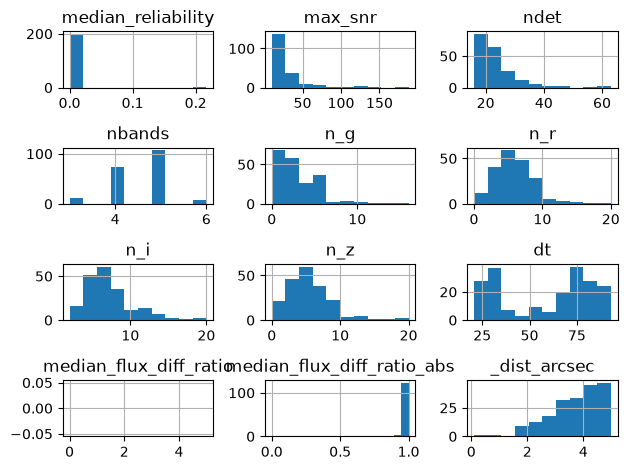

In [10]:
for i,col in enumerate(columns):
    plt.subplot(4,3,i+1)
    if col in bins_map.keys():
        bins = bins_map[col]
    else:
        bins = None
    snmeta[col].hist(bins=bins)
    plt.title(col)
plt.tight_layout()
plt.show()

In [11]:
bazin_cols = [f"bazin_fit_reduced_chi2_{b}" for b in "griz"]
sncat_bazin = lsdb.open_catalog(sncandid_filename,columns=bazin_cols)

In [12]:
snbazin = sncat_bazin.random_sample(200)

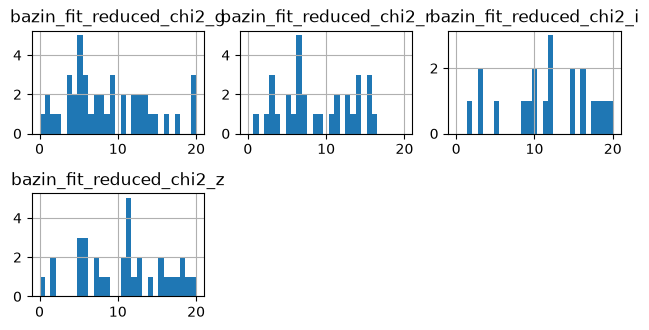

In [13]:
for i,col in enumerate(bazin_cols):
    plt.subplot(3,3,i+1)
    snbazin[col].hist(bins=np.linspace(0,20,30))
    plt.title(col)
plt.tight_layout()
plt.show()

In [38]:
sncat = lsdb.open_catalog(sncandid_filename)

In [39]:
def filter_bazin(df):
    df = df.query("((bazin_fit_reduced_chi2_r > 0.1 and bazin_fit_reduced_chi2_r < 20.0) or "
                  "(bazin_fit_reduced_chi2_g > 0.1 and bazin_fit_reduced_chi2_g < 20.0) or "
                  "(bazin_fit_reduced_chi2_i > 0.1 and bazin_fit_reduced_chi2_i < 20.0) or "
                  "(bazin_fit_reduced_chi2_z > 0.1 and bazin_fit_reduced_chi2_z < 20.0))")
    return df

In [40]:
sn_good = sncat.map_partitions(filter_bazin)

In [41]:
if DDF:
    goodsn_filename = "good_sne_ddf"
else:
    goodsn_filename = "good_sne"
if DESI:
    goodsn_filename = goodsn_filename+"_desi_gal"
print(goodsn_filename)

good_sne_desi_gal


In [42]:
sn_good.write_catalog(goodsn_filename,overwrite=True)

In [43]:
sn_good = lsdb.open_catalog(goodsn_filename)

In [44]:
len(sn_good)

122538

In [45]:
head = sn_good.head()

In [46]:
head

diaObjectId_dia_object_lc  ra_dia_object_lc  \
_healpix_29                                                        
1204926106975500714         769081926630768648        345.996967   
1205762584489950721         772324042823696391        344.895106   
1218154719608123607         777320567257694253        357.320602   
1218163691733199342         777321323171938346        357.122927   
1218206018530535577         777324209389961288        356.805406   

                     dec_dia_object_lc  \
_healpix_29                              
1204926106975500714         -15.523637   
1205762584489950721         -12.932123   
1218154719608123607          -8.257355   
1218163691733199342          -8.079239   
1218206018530535577          -7.514516   

                                   diaObjectForcedSource_dia_object_lc  \
_healpix_29                                                              
1204926106975500714  [{midpointMjdTai: 60858.284577, band: 'r', psf...   
1205762584489950721  [{midpointMjdTai: 60859.381183, band: 'i', psf...   
1218154719608123607  [{midpointMjdTai: 60857.345841, band: 'r', psf...   
1218163691733199342  [{midpointMjdTai: 60857.345841, band: 'r', psf...   
1218206018530535577  [{midpointMjdTai: 60857.343918, band: 'r', psf...   

                                               diaSource_dia_object_lc  \
_healpix_29                                                              
1204926106975500714  [{midpointMjdTai: 60858.284577, band: 'r', psf...   
1205762584489950721  [{midpointMjdTai: 60859.381183, band: 'i', psf...   
1218154719608123607  [{midpointMjdTai: 60858.312075, band: 'i', psf...   
1218163691733199342  [{midpointMjdTai: 60857.345841, band: 'r', psf...   
1218206018530535577  [{midpointMjdTai: 60858.312075, band: 'i', psf...   

                     OBJID_legacysurvey_dr10.1 TYPE_legacysurvey_dr10.1  \
_healpix_29                                                               
1204926106975500714                       7347                      REX   
1205762584489950721                        551                      SER   
1218154719608123607                       2108                      REX   
1218163691733199342                       3272                      REX   
1218206018530535577                       1858                      EXP   

                     Z_PHOT_MEAN_legacysurvey_dr10.1  \
_healpix_29                                            
1204926106975500714                         0.959634   
1205762584489950721                          0.16023   
1218154719608123607                         0.591766   
1218163691733199342                         0.461203   
1218206018530535577                         0.433048   

                     Z_PHOT_STD_legacysurvey_dr10.1  \
_healpix_29                                           
1204926106975500714                        0.387066   
1205762584489950721                        0.028924   
1218154719608123607                        0.361027   
1218163691733199342                        0.028019   
1218206018530535577                        0.055752   

                     Z_SPEC_legacysurvey_dr10.1  ...  bazin_fit_amplitude_z  \
_healpix_29                                      ...                          
1204926106975500714                       -99.0  ...           44990.894531   
1205762584489950721                       -99.0  ...           21629.832031   
1218154719608123607                       -99.0  ...             139540.875   
1218163691733199342                       -99.0  ...               322670.5   
1218206018530535577                       -99.0  ...           24589.535156   

                     bazin_fit_baseline_z  bazin_fit_reference_time_z  \
_healpix_29                                                             
1204926106975500714           3911.550537                  864.221924   
1205762584489950721          16641.453125                  859.048584   
1218154719608123607          -2701.007812                  8

In [29]:
colors = {"u": "pink",
          "g": "green",
          "r": "red",
          "i": "purple",
          "z": "orange",
          "y": "brown"}
def plot_lc(lc,saltpars=None):
    maxflux = 0.
    for f in lc["band"].unique():
        lc_f = lc.loc[lc["band"]==f]
        is_det = np.absolute(lc_f["snr"]) > 5
        lc_det = lc_f.loc[is_det]
        lc_nondet = lc_f.loc[~is_det]
        plt.errorbar(lc_det["mjd"],lc_det["flux"],yerr=lc_det["fluxerr"],fmt='o',label=f, c=colors[f])
        plt.errorbar(lc_nondet["mjd"],lc_nondet["flux"],yerr=lc_nondet["fluxerr"],fmt='>',alpha=0.3, c=colors[f])

        if saltpars is not None:
            model = sncosmo.Model("salt3",effects=[sncosmo.F99Dust()], effect_names=["mw"], effect_frames=["obs"])
            model.update(saltpars)
            time = np.linspace(-20,50,100)*(1.+saltpars["z"]) + saltpars["t0"]
            try:
                flux = model.bandflux("lsst"+f,time,zp=31.4, zpsys='ab')
                maxflux = np.max(np.append(flux,maxflux))
                plt.plot(time,flux,c=colors[f],alpha=0.1,ls="--")
            except:
                continue
        plt.legend()
    is_det = np.absolute(lc["snr"]) > 5
    if saltpars:
        ylim = (-0.2*maxflux, maxflux*1.5)
    else:
        ylim = (-0.2*lc.loc[is_det]["flux"].max(),lc.loc[is_det]["flux"].max()*1.5)
    plt.ylim(ylim)

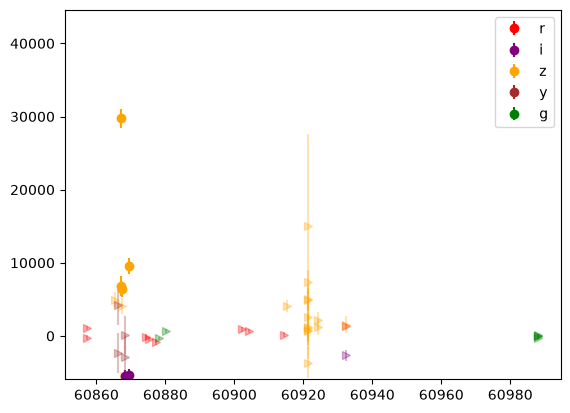

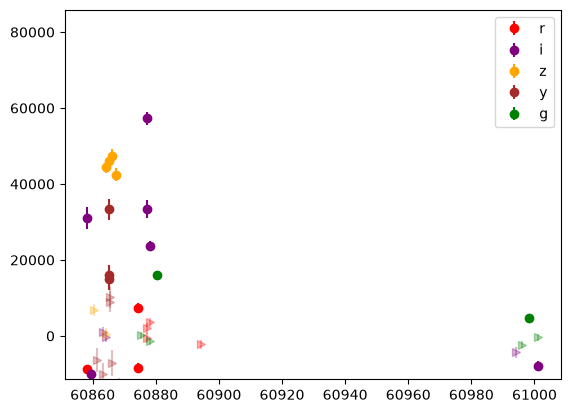

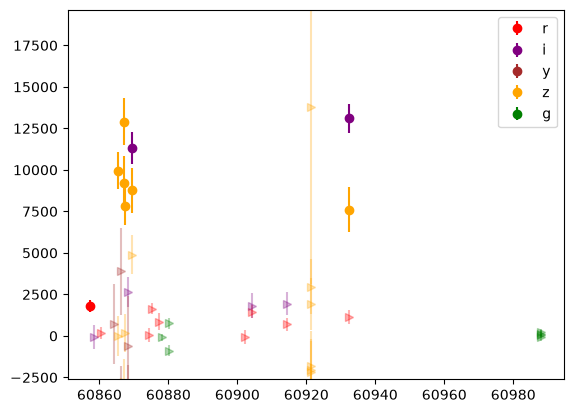

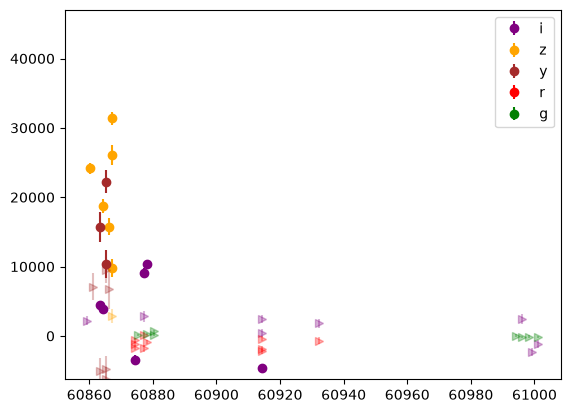

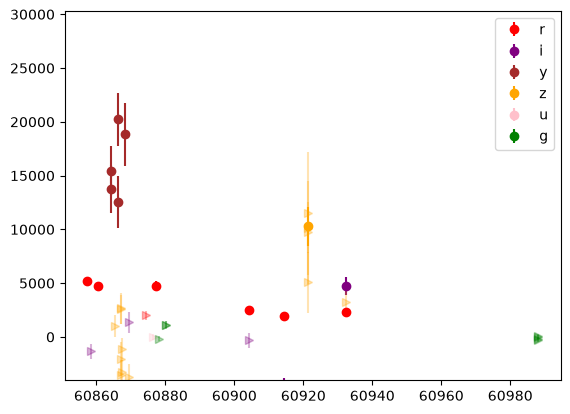

In [48]:
sn = head
for i in np.random.choice(len(sn),size=np.min([20,len(sn)]),replace=False):
    # plt.subplot(2,1,1)
    lc = sn.iloc[i]["diaObjectForcedSource_dia_object_lc"]
    lc = lc[["midpointMjdTai","band","psfDiffFlux","psfDiffFluxErr"]]
    lc["mjd"] = lc["midpointMjdTai"]
    lc["flux"] = lc["psfDiffFlux"]
    lc["fluxerr"] = lc["psfDiffFluxErr"]
    lc["snr"] = lc["flux"]/lc["fluxerr"]
    plot_lc(lc)
    # plt.subplot(2,1,2)
    # lc = sn.iloc[i]["diaSource_dia_object_lc"]
    # lc = lc[["midpointMjdTai","band","psfFlux","psfFluxErr"]]
    # lc["mjd"] = lc["midpointMjdTai"]
    # lc["flux"] = lc["psfFlux"]
    # lc["fluxerr"] = lc["psfFluxErr"]
    # lc["snr"] = lc["flux"]/lc["fluxerr"]
    # plot_lc(lc)
    plt.show()

In [49]:
def lc_quality_cuts(flux,mjd,filter,snr, n_phases=5, n_before_peak=1, n_after_peak=2, n_bands=3):
    det = snr > 5
    flux = flux[det]
    mjd = mjd[det]
    filter = filter[det]
    if len(flux) == 0:
        return {"pass_quality_cuts": False}
    peak_idx = np.argmax(flux)
    phases = np.floor((mjd - mjd[peak_idx]))
    unique_phases,unique_idx = np.unique(phases,return_index=True)
    good_idx = (unique_phases >= -40) & (unique_phases<=100)
    pass_cut = len(unique_phases[good_idx]) >= n_phases
    flux_new = flux[unique_idx][good_idx]
    peak_idx_new = np.argmax(flux_new)
    pass_cut &= (peak_idx_new >= n_before_peak - 1) & (len(flux_new) - peak_idx_new >= n_after_peak - 1)
    good_phases = (phases >= -40) & (phases<=100)
    pass_cut &= len(np.unique(filter[good_phases])) >= n_bands
    return {"pass_quality_cuts": pass_cut}

In [50]:
def make_lc_quality_cuts(df):
    if len(df) == 0:
        df = df.assign(**{name: np.array([], dtype=np.float32) for name in ["pass_quality_cut"]}) 
    else:
        df["diaObjectForcedSource_dia_object_lc.snr"] = df["diaObjectForcedSource_dia_object_lc.psfDiffFlux"]/df["diaObjectForcedSource_dia_object_lc.psfDiffFluxErr"]
        df = df.map_rows(lc_quality_cuts,columns=["diaObjectForcedSource_dia_object_lc.psfDiffFlux",
                                       "diaObjectForcedSource_dia_object_lc.midpointMjdTai",
                                       "diaObjectForcedSource_dia_object_lc.band",
                                       "diaObjectForcedSource_dia_object_lc.snr"],
                                       row_container="args",output_names=["pass_quality_cut"], 
                                       append_columns=True)
    return df

In [51]:
sn_good_after_quality_cut = sn_good.map_partitions(make_lc_quality_cuts)

In [5]:
if DESI:
    desi_str = "_desi_gal"
else:
    desi_str = ""
good_qc_filename = f"good_sne{desi_str}_after_quality_cut"

In [53]:
sn_good_after_quality_cut = sn_good_after_quality_cut.query("pass_quality_cut == True")
sn_good_after_quality_cut.write_catalog(good_qc_filename,overwrite=True)

In [54]:
sn_good_after_quality_cut = lsdb.open_catalog(good_qc_filename)
len(sn_good_after_quality_cut)

75859

In [55]:
head = sn_good_after_quality_cut.head()

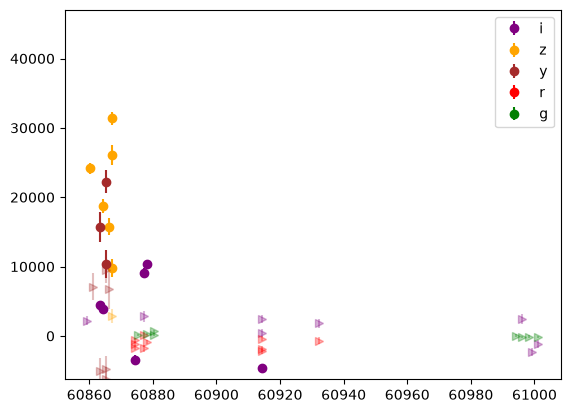

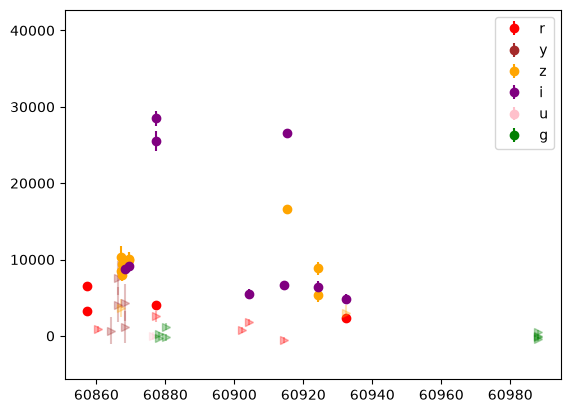

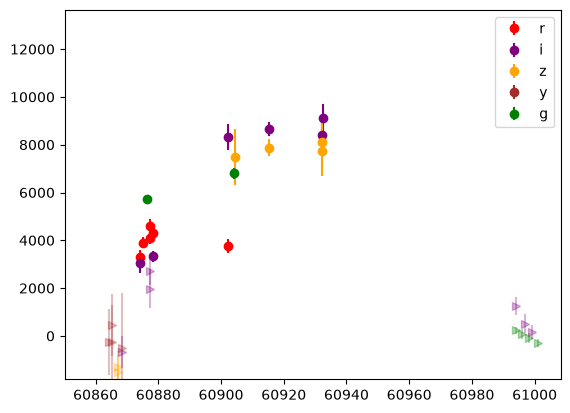

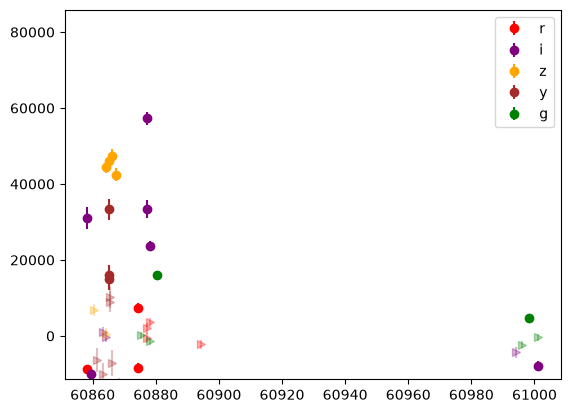

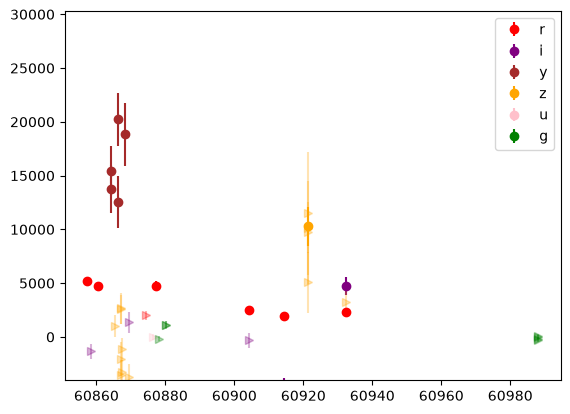

In [56]:
sn = head
for i in np.random.choice(len(sn),size=np.min([20,len(sn)]),replace=False):
    # plt.subplot(2,1,1)
    lc = sn.iloc[i]["diaObjectForcedSource_dia_object_lc"]
    lc = lc[["midpointMjdTai","band","psfDiffFlux","psfDiffFluxErr"]]
    lc["mjd"] = lc["midpointMjdTai"]
    lc["flux"] = lc["psfDiffFlux"]
    lc["fluxerr"] = lc["psfDiffFluxErr"]
    lc["snr"] = lc["flux"]/lc["fluxerr"]
    plot_lc(lc)
    # plt.subplot(2,1,2)
    # lc = sn.iloc[i]["diaSource_dia_object_lc"]
    # lc = lc[["midpointMjdTai","band","psfFlux","psfFluxErr"]]
    # lc["mjd"] = lc["midpointMjdTai"]
    # lc["flux"] = lc["psfFlux"]
    # lc["fluxerr"] = lc["psfFluxErr"]
    # lc["snr"] = lc["flux"]/lc["fluxerr"]
    # plot_lc(lc)
    plt.show()

In [57]:
from lcfit import fit_single_lc  

def fit_single_lc_w_cond(lc,
                         bounds={"x1": (-4,4),
                                 "c": (-0.4,0.4),},
                         phase_range=(-10,40),
                         modelcov=False):
    return fit_single_lc(lc,mpbounds=bounds,phase_range=phase_range,modelcov=modelcov)

In [58]:
def infer_z_from_peakmag(row):
    peakflux = np.max(row)
    peakmag = flux2mag(peakflux)
    z = Distance(distmod = peakmag + 19).compute_z(cosmology=Planck18).value
    return z

In [59]:
def compute_z_from_peakmag(df):
    if len(df) == 0:
        df = df.assign(**{name: np.array([], dtype=np.float32) for name in ["z_est"]}) 
    else:
        df = df.map_rows(infer_z_from_peakmag, columns=["diaSource_dia_object_lc.psfFlux"], row_container="args",
                         output_names=["z_est"], append_columns=True)
    return df

In [145]:
def fit_salt2(df):
    saltcolumns = ['success', 'ncall', 'chisq', 'ndof', 'z', 'z_err', 't0', 't0_err', 'x0',
           'x0_err', 'x1', 'x1_err', 'c', 'c_err', 'mwebv', 'mwebv_err', 'z_z_cov',
           'z_t0_cov', 'z_x0_cov', 'z_x1_cov', 'z_c_cov', 'z_mwebv_cov',
           't0_z_cov', 't0_t0_cov', 't0_x0_cov', 't0_x1_cov', 't0_c_cov',
           't0_mwebv_cov', 'x0_z_cov', 'x0_t0_cov', 'x0_x0_cov', 'x0_x1_cov',
           'x0_c_cov', 'x0_mwebv_cov', 'x1_z_cov', 'x1_t0_cov', 'x1_x0_cov',
           'x1_x1_cov', 'x1_c_cov', 'x1_mwebv_cov', 'c_z_cov', 'c_t0_cov',
           'c_x0_cov', 'c_x1_cov', 'c_c_cov', 'c_mwebv_cov', 'mwebv_z_cov',
           'mwebv_t0_cov', 'mwebv_x0_cov', 'mwebv_x1_cov', 'mwebv_c_cov',
           'mwebv_mwebv_cov', 'id', 'fit_error']
    dtypes = [np.float64]*(len(saltcolumns)-2)+ [int] + [str]

    df["z_est"] = df["Z_PHOT_MEAN_legacysurvey_dr10.1"]
    df["z_est_err"] = df["Z_PHOT_STD_legacysurvey_dr10.1"]

    if len(df) == 0:
        df = df.assign(**{name: np.array([], dtype=dtype) for name,dtype in zip(saltcolumns,dtypes)}) 
    else:
        df = df.map_rows(fit_single_lc_w_cond, 
                         columns=["ra_dia_object_lc","dec_dia_object_lc","diaObjectId_dia_object_lc", "z_est",
                                  "diaSource_dia_object_lc.midpointMjdTai", "diaSource_dia_object_lc.band",
                                  "diaSource_dia_object_lc.psfFlux","diaSource_dia_object_lc.psfFluxErr"], 
                         append_columns=True)
    return df

In [146]:
sn_good_after_quality_cut = lsdb.open_catalog(good_qc_filename)
# sn_good_after_quality_cut = sn_good_after_quality_cut.map_partitions(compute_z_from_peakmag)

In [147]:
# # for debugging
# sn_good_after_quality_cut = sn_good_after_quality_cut.partitions[0:100]

In [148]:
res = sn_good_after_quality_cut.map_partitions(fit_salt2,compute_single_partition=False)

In [149]:
head = res.head()

/astro/users/midai/.conda/envs/lf_env/lib/python3.11/site-packages/sncosmo/fitting.py:191: RuntimeWarning: Dropping following bands from data: lynx_lsst_g(out of model wavelength range)
  warnings.warn("Dropping following bands from data: " +
/astro/users/midai/.conda/envs/lf_env/lib/python3.11/site-packages/sncosmo/fitting.py:191: RuntimeWarning: Dropping following bands from data: lynx_lsst_g(out of model wavelength range)
  warnings.warn("Dropping following bands from data: " +


In [150]:
head

diaObjectId_dia_object_lc  ra_dia_object_lc  \
_healpix_29                                                        
1204926106975500714         769081926630768648        345.996967   
1205762584489950721         772324042823696391        344.895106   
1218154719608123607         777320567257694253        357.320602   
1218213974998685157         778973889148485641        357.350255   
1218323371960852628         774003684274077713        352.294598   

                     dec_dia_object_lc  \
_healpix_29                              
1204926106975500714         -15.523637   
1205762584489950721         -12.932123   
1218154719608123607          -8.257355   
1218213974998685157          -7.437324   
1218323371960852628         -10.803756   

                                   diaObjectForcedSource_dia_object_lc  \
_healpix_29                                                              
1204926106975500714  [{midpointMjdTai: 60858.284577, band: 'r', psf...   
1205762584489950721  [{midpointMjdTai: 60859.381183, band: 'i', psf...   
1218154719608123607  [{midpointMjdTai: 60857.345841, band: 'r', psf...   
1218213974998685157  [{midpointMjdTai: 60857.345841, band: 'r', psf...   
1218323371960852628  [{midpointMjdTai: 60857.341567, band: 'r', psf...   

                                               diaSource_dia_object_lc  \
_healpix_29                                                              
1204926106975500714  [{midpointMjdTai: 60858.284577, band: 'r', psf...   
1205762584489950721  [{midpointMjdTai: 60859.381183, band: 'i', psf...   
1218154719608123607  [{midpointMjdTai: 60858.312075, band: 'i', psf...   
1218213974998685157  [{midpointMjdTai: 60857.345841, band: 'r', psf...   
1218323371960852628  [{midpointMjdTai: 60857.341567, band: 'r', psf...   

                     OBJID_legacysurvey_dr10.1 TYPE_legacysurvey_dr10.1  \
_healpix_29                                                               
1204926106975500714                       7347                      REX   
1205762584489950721                        551                      SER   
1218154719608123607                       2108                      REX   
1218213974998685157                       2501                      REX   
1218323371960852628                       3455                      REX   

                     Z_PHOT_MEAN_legacysurvey_dr10.1  \
_healpix_29                                            
1204926106975500714                         0.959634   
1205762584489950721                          0.16023   
1218154719608123607                         0.591766   
1218213974998685157                         0.984346   
1218323371960852628                         0.281092   

                     Z_PHOT_STD_legacysurvey_dr10.1  \
_healpix_29                                           
1204926106975500714                        0.387066   
1205762584489950721                        0.028924   
1218154719608123607                        0.361027   
1218213974998685157                        0.201341   
1218323371960852628                        0.048447   

                     Z_SPEC_legacysurvey_dr10.1  ...       c_c_cov  \
_healpix_29                                      ...                 
1204926106975500714                       -99.0  ...  2.761495e-10   
1205762584489950721                       -99.0  ...  1.658480e-11   
1218154719608123607                       -99.0  ...  1.792819e-20   
1218213974998685157                       -99.0  ...  9.980361e-04   
1218323371960852628                       -99.0  ...  1.986712e-03   

                     c_mwebv_cov  mwebv_z_cov  mwebv_t0_cov  mwebv_x0_cov  \
_healpix_29                                                                 
1204926106975500714          0.0          0.0           0.0           0.0   
1205762584489950721          0.0          0.0           0.0           0.0   
1218154719608123607          0.0          0.0           0.0           0.0   
1218213974998685157          0

In [32]:
saltfit_filename = f"saltfit_on_good_sne{desi_str}_after_quality_cut"

In [ ]:
if refit_salt:
    res.write_catalog(saltfit_filename,overwrite=True)

/astro/users/midai/.conda/envs/lf_env/lib/python3.11/site-packages/sncosmo/fitting.py:191: RuntimeWarning: Dropping following bands from data: lynx_lsst_g(out of model wavelength range)
  warnings.warn("Dropping following bands from data: " +
/astro/users/midai/.conda/envs/lf_env/lib/python3.11/site-packages/sncosmo/fitting.py:191: RuntimeWarning: Dropping following bands from data: lynx_lsst_g(out of model wavelength range)
  warnings.warn("Dropping following bands from data: " +
/astro/users/midai/.conda/envs/lf_env/lib/python3.11/site-packages/sncosmo/fitting.py:191: RuntimeWarning: Dropping following bands from data: lynx_lsst_g(out of model wavelength range)
  warnings.warn("Dropping following bands from data: " +
/astro/users/midai/.conda/envs/lf_env/lib/python3.11/site-packages/sncosmo/fitting.py:191: RuntimeWarning: Dropping following bands from data: lynx_lsst_r, lynx_lsst_g, lynx_lsst_i(out of model wavelength range)
  warnings.warn("Dropping following bands from data: " +
/a

In [33]:
columns = ['diaObjectId_dia_object_lc','success', 'ncall', 'chisq', 'ndof', 'z', 'z_err', 't0', 't0_err', 'x0',
           'x0_err', 'x1', 'x1_err', 'c', 'c_err', 'mwebv', 'mwebv_err', 'z_z_cov',
           'z_t0_cov', 'z_x0_cov', 'z_x1_cov', 'z_c_cov', 'z_mwebv_cov',
           't0_z_cov', 't0_t0_cov', 't0_x0_cov', 't0_x1_cov', 't0_c_cov',
           't0_mwebv_cov', 'x0_z_cov', 'x0_t0_cov', 'x0_x0_cov', 'x0_x1_cov',
           'x0_c_cov', 'x0_mwebv_cov', 'x1_z_cov', 'x1_t0_cov', 'x1_x0_cov',
           'x1_x1_cov', 'x1_c_cov', 'x1_mwebv_cov', 'c_z_cov', 'c_t0_cov',
           'c_x0_cov', 'c_x1_cov', 'c_c_cov', 'c_mwebv_cov', 'mwebv_z_cov',
           'mwebv_t0_cov', 'mwebv_x0_cov', 'mwebv_x1_cov', 'mwebv_c_cov',
           'mwebv_mwebv_cov', 'id', 'fit_error', 'diaSource_dia_object_lc',
           'diaObjectForcedSource_dia_object_lc','_dist_arcsec']
saltres = lsdb.open_catalog(saltfit_filename,columns=columns)
len(saltres)

75859

In [34]:
saltres.columns

Index(['diaObjectId_dia_object_lc', 'success', 'ncall', 'chisq', 'ndof', 'z',
       'z_err', 't0', 't0_err', 'x0', 'x0_err', 'x1', 'x1_err', 'c', 'c_err',
       'mwebv', 'mwebv_err', 'z_z_cov', 'z_t0_cov', 'z_x0_cov', 'z_x1_cov',
       'z_c_cov', 'z_mwebv_cov', 't0_z_cov', 't0_t0_cov', 't0_x0_cov',
       't0_x1_cov', 't0_c_cov', 't0_mwebv_cov', 'x0_z_cov', 'x0_t0_cov',
       'x0_x0_cov', 'x0_x1_cov', 'x0_c_cov', 'x0_mwebv_cov', 'x1_z_cov',
       'x1_t0_cov', 'x1_x0_cov', 'x1_x1_cov', 'x1_c_cov', 'x1_mwebv_cov',
       'c_z_cov', 'c_t0_cov', 'c_x0_cov', 'c_x1_cov', 'c_c_cov', 'c_mwebv_cov',
       'mwebv_z_cov', 'mwebv_t0_cov', 'mwebv_x0_cov', 'mwebv_x1_cov',
       'mwebv_c_cov', 'mwebv_mwebv_cov', 'id', 'fit_error',
       'diaSource_dia_object_lc', 'diaObjectForcedSource_dia_object_lc',
       '_dist_arcsec', 'ra_dia_object_lc', 'dec_dia_object_lc'],
      dtype='object')

In [35]:
saltres = saltres.query("success == 1 and "
                        "(x1 > -3.99 and x1 < 3.99) and " 
                        "(c > -0.399 and c < 0.399) and "
                        "mwebv < 0.25")
saltparcut_filename = f"saltfit_on_good_sne{desi_str}_after_quality_cut_and_saltpar_cut"
saltres.write_catalog(saltparcut_filename,overwrite=True)

Writing Catalog: 100%|██████████| 6528/6528 [03:49<00:00, 28.47it/s] 


In [36]:
saltres = lsdb.open_catalog(saltparcut_filename)

/astro/users/midai/.conda/envs/lf_env/lib/python3.11/site-packages/hats/inspection/_plotting.py:153: UserWarning: This plot contains HEALPix pixels smaller than a pixel of the plot. Some values may be lost
  warnings.warn(


(<Figure size 1000x500 with 2 Axes>,
 <WCSAxes: title={'center': 'Catalog pixel map - dia_object_lc_x_legacysurvey_dr10.1'}>)

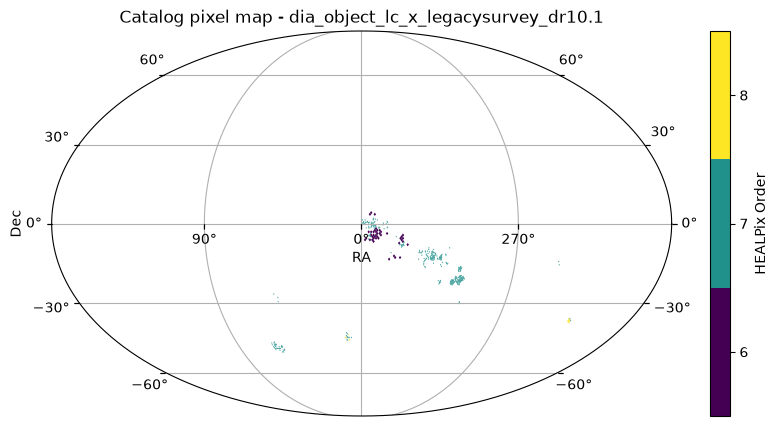

In [37]:
saltres.plot_pixels()

In [38]:
result_good = saltres.compute()

Computing Catalog: 100%|██████████| 1189/1189 [00:07<00:00, 151.06it/s]


In [39]:
if DESI:
    desi_str = "_desi_gal"
else:
    desi_str = ""
if DDF:
    res_filename = f"saltfit_good_sne_ddf{desi_str}.parquet"
else:
    res_filename = f"saltfit_good_sne{desi_str}.parquet"

In [40]:
result_good.to_parquet(res_filename)

In [41]:
result_good = npd.read_parquet(res_filename)

In [42]:
result_good

diaObjectId_dia_object_lc  success  ncall       chisq  ndof         z  \
0           778958221107789843      1.0  225.0  224.688675   9.0  1.090821   
1           780630990610497629      1.0  510.0   29.075569   4.0  0.127095   
..                         ...      ...    ...         ...   ...       ...   
869         773814911871484155      1.0  916.0  307.592313  -3.0  1.362006   
870         775454902183788845      1.0  389.0  186.679466   9.0  0.741944   

        z_err            t0     t0_err        x0  ...  mwebv_c_cov  \
0    0.020025  60893.054783    0.71515  0.000034  ...          0.0   
1    0.039461  60926.265825    4.69548  0.000077  ...          0.0   
..        ...           ...        ...       ...  ...          ...   
869  0.736273  60903.678269  21.631056  0.000039  ...          0.0   
870  0.015382  60808.787551   1.544221   0.00032  ...          0.0   

     mwebv_mwebv_cov                  id  fit_error  \
0                0.0  778958221107789843       None   
1                0.0  780630990610497629       None   
..               ...                 ...        ...   
869              0.0  773814911871484155       None   
870              0.0  775454902183788845       None   

                               diaSource_dia_object_lc  \
0    [{midpointMjdTai: 60857.345321, band: 'r', psf...   
1    [{midpointMjdTai: 60867.208362, band: 'z', psf...   
..                                                 ...   
869  [{midpointMjdTai: 60847.27984, band: 'r', psfF...   
870  [{midpointMjdTai: 60847.328697, band: 'z', psf...   

                   diaObjectForcedSource_dia_object_lc  _dist_arcsec  \
0    [{midpointMjdTai: 60857.345321, band: 'r', psf...      3.153582   
1    [{midpointMjdTai: 60857.345321, band: 'r', psf...      0.156068   
..                                                 ...           ...   
869  [{midpointMjdTai: 60847.237627, band: 'i', psf...      4.766478   
870  [{midpointMjdTai: 60847.256083, band: 'i', psf...      4.601078   

     ra_dia_object_lc  dec_dia_object_lc          _healpix_29  
0           352.62843          -6.334194  1220176187157903715  
1          355.249319          -5.732492  1220322434412554621  
..                ...                ...                  ...  
869         311.07363         -11.545452  3450270214699607887  
870        309.110952          -8.965509  3453177674417222438  

[871 rows x 61 columns]

<Axes: >

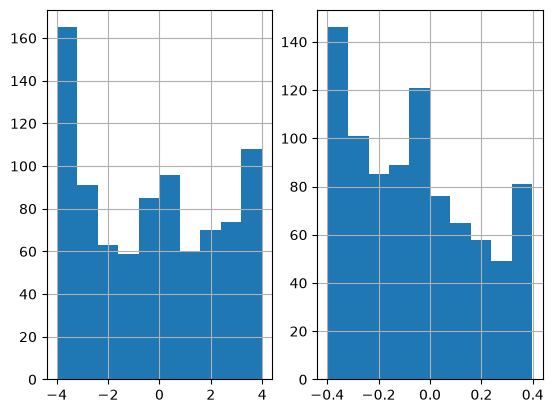

In [43]:
plt.subplot(1,2,1)
result_good.x1.hist()
plt.subplot(1,2,2)
result_good.c.hist()

In [44]:
result_good["reduced_chisq"] = result_good.chisq / result_good.ndof

<Axes: >

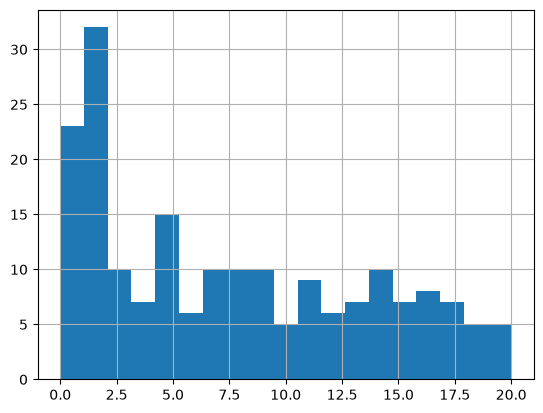

In [45]:
result_good.reduced_chisq.hist(bins = np.linspace(0, 20, 20))

In [46]:
sn_good = result_good.loc[(result_good.reduced_chisq > 0.01) & (result_good.reduced_chisq < 10.)]

In [47]:
sn_good

diaObjectId_dia_object_lc  success  ncall      chisq  ndof         z  \
1           780630990610497629      1.0  510.0  29.075569   4.0  0.127095   
14          772304182894919788      1.0  195.0  41.697743  10.0  1.208554   
..                         ...      ...    ...        ...   ...       ...   
860         773844736124387597      1.0  411.0   3.003702   1.0  0.974205   
863         773844323807526922      1.0  137.0  51.137538  10.0  1.169243   

        z_err            t0    t0_err        x0  ...  mwebv_mwebv_cov  \
1    0.039461  60926.265825   4.69548  0.000077  ...              0.0   
14   0.007003  60883.667199  0.330081  0.000085  ...              0.0   
..        ...           ...       ...       ...  ...              ...   
860   0.10605  60888.445714   1.80636   0.00002  ...              0.0   
863  0.027486  60778.772098  1.684159  0.000703  ...              0.0   

                     id  fit_error  \
1    780630990610497629       None   
14   772304182894919788       None   
..                  ...        ...   
860  773844736124387597       None   
863  773844323807526922       None   

                               diaSource_dia_object_lc  \
1    [{midpointMjdTai: 60867.208362, band: 'z', psf...   
14   [{midpointMjdTai: 60859.381695, band: 'i', psf...   
..                                                 ...   
860  [{midpointMjdTai: 60835.330907, band: 'i', psf...   
863  [{midpointMjdTai: 60831.299006, band: 'i', psf...   

                   diaObjectForcedSource_dia_object_lc  _dist_arcsec  \
1    [{midpointMjdTai: 60857.345321, band: 'r', psf...      0.156068   
14   [{midpointMjdTai: 60857.340952, band: 'r', psf...      3.803243   
..                                                 ...           ...   
860  [{midpointMjdTai: 60831.299006, band: 'i', psf...      3.610064   
863  [{midpointMjdTai: 60831.299006, band: 'i', psf...      3.154884   

     ra_dia_object_lc  dec_dia_object_lc          _healpix_29  reduced_chisq  
1          355.249319          -5.732492  1220322434412554621       7.268892  
14         340.086735         -12.723253  1299258317000062672       4.169774  
..                ...                ...                  ...            ...  
860        318.060282         -10.979972  3447613516462324053       3.003702  
863        317.441004         -11.090076  3447663982156316504       5.113754  

[123 rows x 62 columns]

<Axes: >

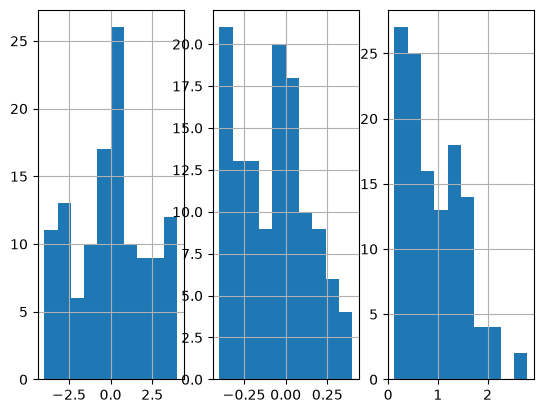

In [48]:
plt.subplot(1,3,1)
sn_good.x1.hist()
plt.subplot(1,3,2)
sn_good.c.hist()
plt.subplot(1,3,3)
sn_good.z.hist()

In [49]:
# define quality cuts for lightcurves
def lc_quality_cuts(flux,mjd,filter,z,t0,n_phases=5, n_before_peak=1, n_after_peak=2, n_bands=3):
    phases = np.floor((mjd - t0)/(1. + z))
    unique_phases,unique_idx = np.unique(phases,return_index=True)
    good_idx = (unique_phases >= -10) & (unique_phases<=40)
    pass_cut = len(unique_phases[good_idx]) >= n_phases
    if np.sum(good_idx) == 0:
        return {"pass_quality_cuts": False}
    pass_before = np.sum(unique_phases[good_idx] < 0) >= n_before_peak
    pass_after = np.sum(unique_phases[good_idx] > 0) >= n_after_peak
    pass_cut = len(unique_phases[good_idx]) >= n_phases
    pass_cut &= pass_before
    pass_cut &= pass_after
    pass_cut &= len(np.unique(filter[(phases >=-10) & (phases <=40)])) >= n_bands
    return {"pass_quality_cuts": pass_cut}

In [50]:
sn = sn_good

In [51]:
sn["diaObjectForcedSource_dia_object_lc.snr"] = sn["diaObjectForcedSource_dia_object_lc.psfDiffFlux"]/sn["diaObjectForcedSource_dia_object_lc.psfDiffFluxErr"]
sn_det = sn.query("diaObjectForcedSource_dia_object_lc.snr > 5")
pass_quality_cut = sn_det.map_rows(lc_quality_cuts,columns=["diaObjectForcedSource_dia_object_lc.psfDiffFlux",
                               "diaObjectForcedSource_dia_object_lc.midpointMjdTai",
                               "diaObjectForcedSource_dia_object_lc.band","z","t0"],
                               row_container="args")
idx = pass_quality_cut.query("pass_quality_cuts == True").index
sn["pass_quality_cuts"] = False
sn.loc[idx,"pass_quality_cuts"] = True
sn = sn[sn["pass_quality_cuts"] == True]

In [52]:
sn

diaObjectId_dia_object_lc  success  ncall      chisq  ndof         z  \
17          772323012031545366      1.0  137.0  33.748806  11.0  0.252415   
18          772313253865848884      1.0  532.0  55.790578  12.0  1.425563   
..                         ...      ...    ...        ...   ...       ...   
797         772180212958887960      1.0  259.0  80.257384   9.0  1.146903   
845         773851814230491358      1.0  148.0  33.343291   5.0  1.404349   

        z_err            t0    t0_err        x0  ...                  id  \
17   0.009713   60899.31491  0.282784  0.000091  ...  772323012031545366   
18     0.0167  60882.522149  0.902444  0.000026  ...  772313253865848884   
..        ...           ...       ...       ...  ...                 ...   
797  0.019996  60877.338831  0.867472   0.00002  ...  772180212958887960   
845  0.032578  60875.788303   2.67288  0.000021  ...  773851814230491358   

     fit_error                            diaSource_dia_object_lc  \
17        None  [{midpointMjdTai: 60858.283213, band: 'r', psf...   
18        None  [{midpointMjdTai: 60858.292455, band: 'r', psf...   
..         ...                                                ...   
797       None  [{midpointMjdTai: 60847.237627, band: 'i', psf...   
845       None  [{midpointMjdTai: 60835.311489, band: 'y', psf...   

                   diaObjectForcedSource_dia_object_lc  _dist_arcsec  \
17   [{midpointMjdTai: 60858.283213, band: 'r', psf...      1.796077   
18   [{midpointMjdTai: 60858.292455, band: 'r', psf...      2.633805   
..                                                 ...           ...   
797  [{midpointMjdTai: 60847.237627, band: 'i', psf...      4.894025   
845  [{midpointMjdTai: 60831.299006, band: 'i', psf...       3.08508   

     ra_dia_object_lc  dec_dia_object_lc          _healpix_29  reduced_chisq  \
17         344.062653         -13.212534  1301639150157111366       3.068073   
18         341.375774         -12.146263  1302264974269281310       4.649215   
..                ...                ...                  ...            ...   
797         313.44597         -12.648956  3444732138484481590       8.917487   
845        319.053574         -10.963088  3446096665658462244       6.668658   

     pass_quality_cuts  
17                True  
18                True  
..                 ...  
797               True  
845               True  

[58 rows x 63 columns]

{'x0': 9.846220516854145e-06, 'x1': 3.7852034951778846, 'c': -0.3935247356537435, 'z': 1.5208529949114853, 'mwebv': 0.07432958043182482, 't0': 60852.36573284845}
3.6025296975460015 7.682356581768394


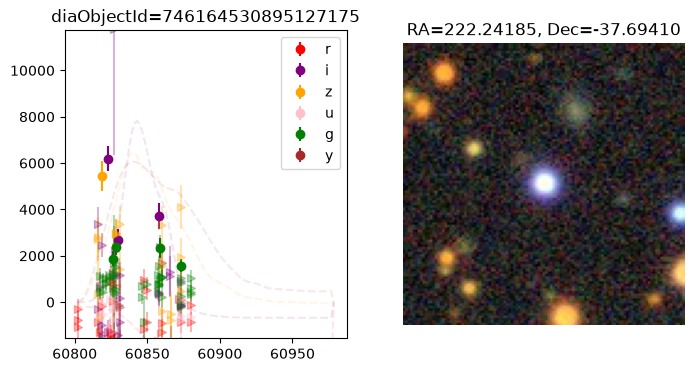

{'x0': 1.5055157417955015e-05, 'x1': 1.4531276954387233, 'c': -0.30193203376223976, 'z': 1.1373758593753984, 'mwebv': 0.08961801799348613, 't0': 60877.1139841916}
1.8984442885622046 9.02288907291905


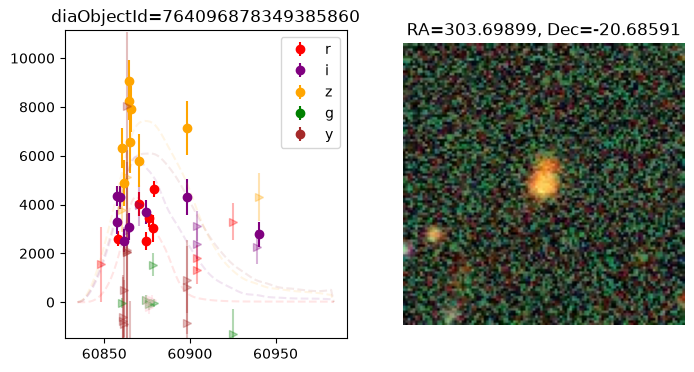

{'x0': 5.310292865982157e-05, 'x1': -3.190502083343542, 'c': -0.19375696896787137, 'z': 1.5413515305195515, 'mwebv': 0.02387646819438107, 't0': 60890.575460292035}
2.545487174855082 2.5131133413652993


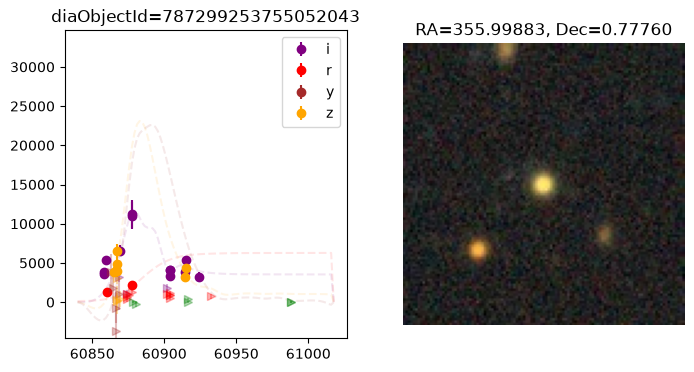

{'x0': 1.1724870265156623e-05, 'x1': 3.117914798318045, 'c': -0.044924441814403464, 'z': 0.49746800231811283, 'mwebv': 0.06242229370439186, 't0': 60862.96007628745}
4.6231720423972975 5.124604450005729


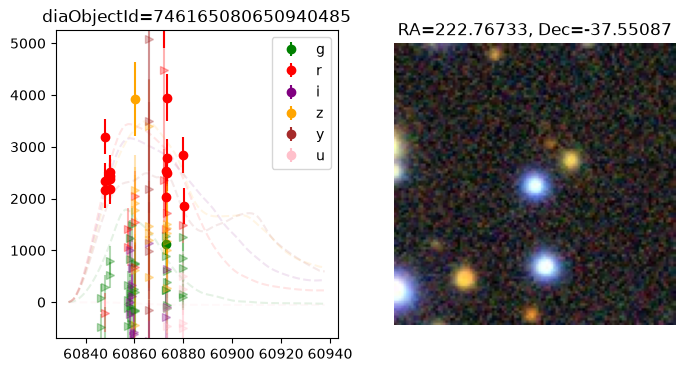

{'x0': 3.4285593529018496e-05, 'x1': -0.24857798138475182, 'c': 0.3934986827197963, 'z': 1.4092962391780182, 'mwebv': 0.05018509795910813, 't0': 60872.539775049154}
3.223813284988323 6.771846913325864


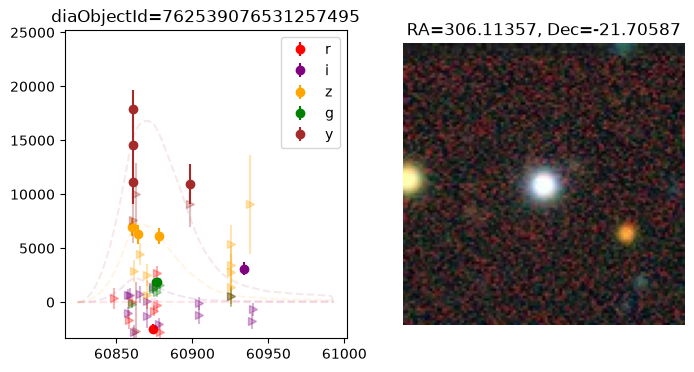

{'x0': 7.161325644687546e-06, 'x1': 0.40401560552552657, 'c': 0.04757104153326294, 'z': 0.4732259603732157, 'mwebv': 0.008049945325156153, 't0': 60867.14884133897}
1.0864463266201645 1.8062449756514407


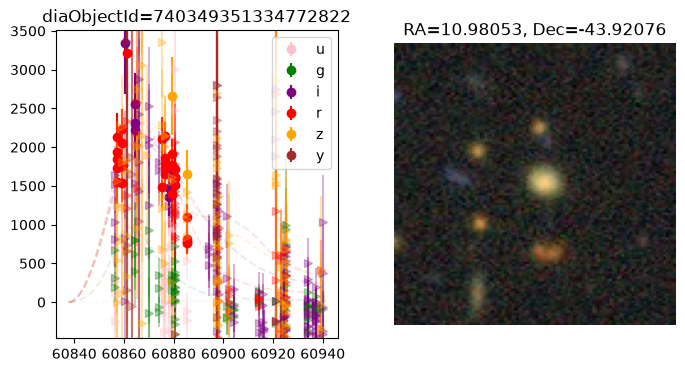

{'x0': 2.9346342893753938e-05, 'x1': -1.5206938090325306, 'c': -0.29943283274022675, 'z': 0.2992658041264238, 'mwebv': 0.06623530188420867, 't0': 60903.160937820205}
1.748617832189548 4.192829953253861


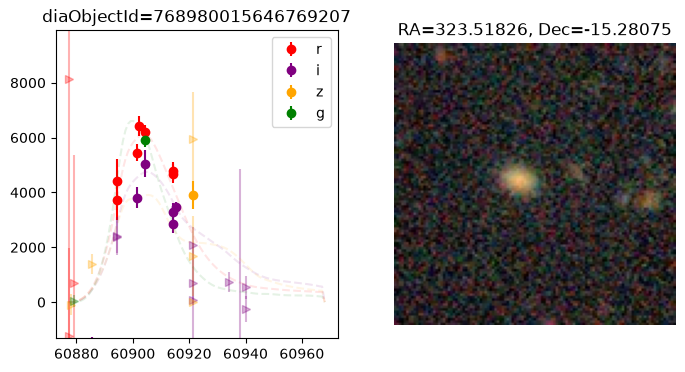

{'x0': 9.291604508623044e-06, 'x1': 0.6194980072181911, 'c': -0.3328642423981352, 'z': 0.8470721579142677, 'mwebv': 0.011774332331911105, 't0': 60886.38651325123}
0.6296082193001742 1.5603602077746437


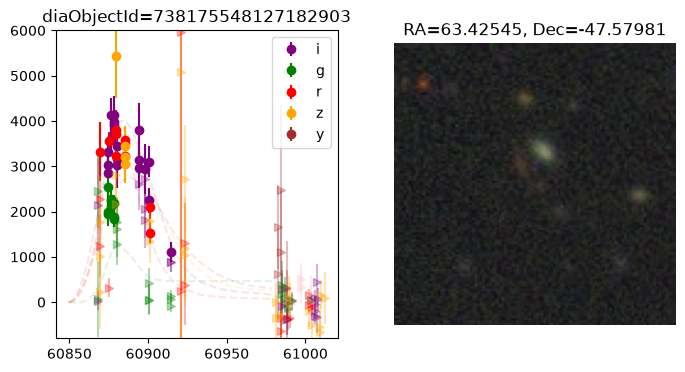

{'x0': 2.0829245313246936e-05, 'x1': -0.5626278752326427, 'c': -0.2947323709886896, 'z': 0.538497024684798, 'mwebv': 0.011458125387886417, 't0': 60869.55537485209}
0.5214371762967684 4.20986139267646


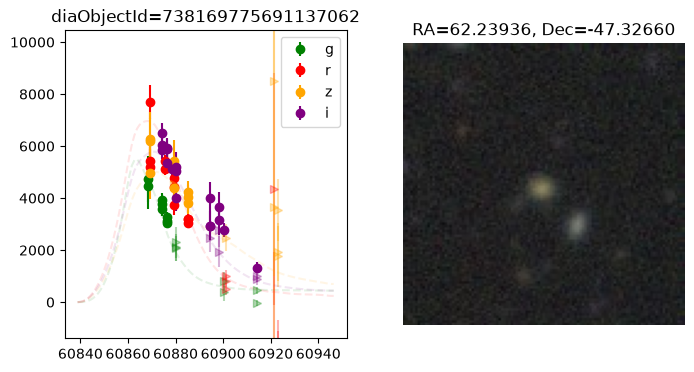

{'x0': 1.4136549987325217e-05, 'x1': -0.48042573631584085, 'c': 0.07846410684786012, 'z': 0.34262478142409597, 'mwebv': 0.0677415413147609, 't0': 60864.43682129069}
0.6227077078374744 1.7986959157472902


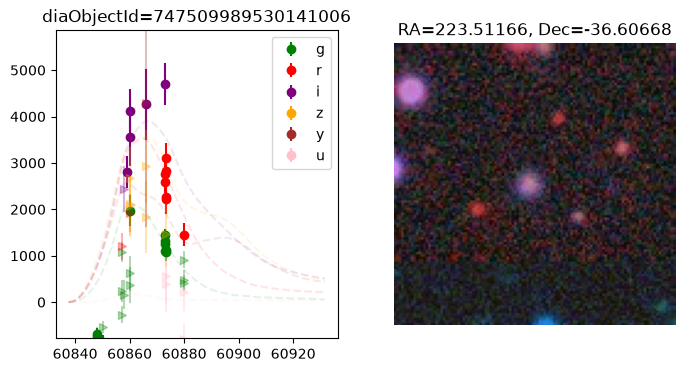

{'x0': 3.666429194460355e-05, 'x1': 0.014428369974486183, 'c': -0.24777248904808633, 'z': 1.8367026179078851, 'mwebv': 0.006917659537698425, 't0': 60893.04366463483}
4.263136436916532 0.7846420834530053


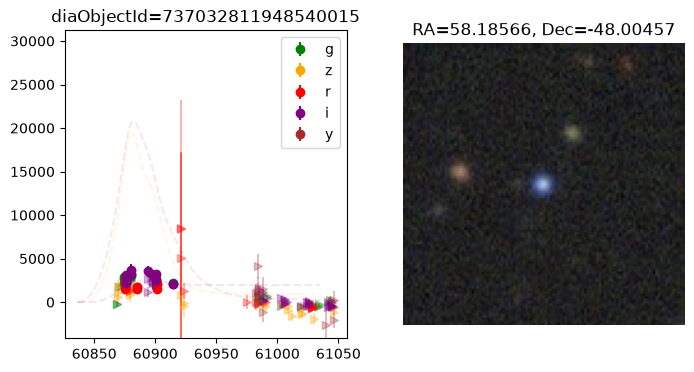

{'x0': 3.762445880659576e-05, 'x1': -0.623778047870894, 'c': -0.10128361046524417, 'z': 0.31611119257538955, 'mwebv': 0.05828968003929629, 't0': 60903.67517822656}
4.023862885901629 1.6063110035715604


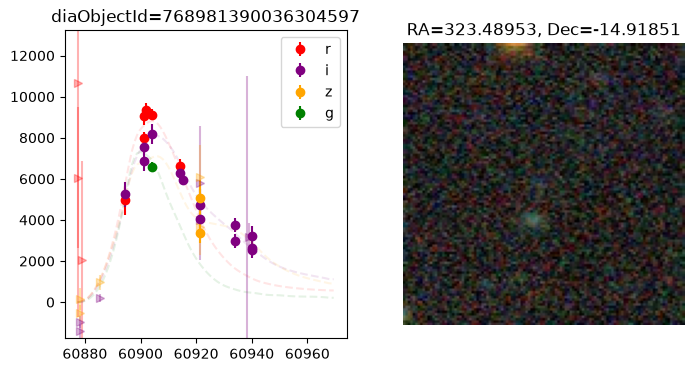

{'x0': 5.57749743544213e-05, 'x1': -2.876536879919795, 'c': -0.30535858414543476, 'z': 2.035267079099205, 'mwebv': 0.05085431282137742, 't0': 60886.40782738184}
2.242007196103479 4.26436604109356


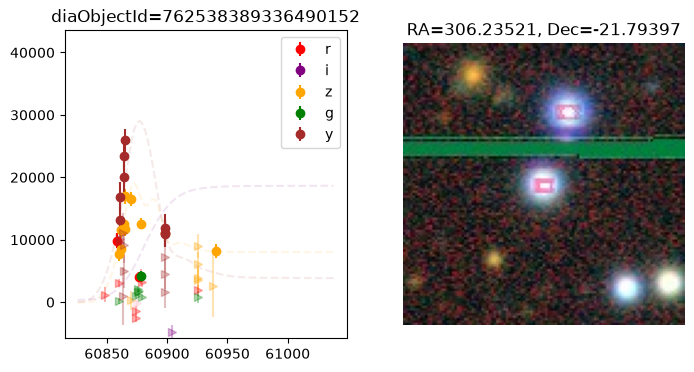

{'x0': 1.0590931775956777e-05, 'x1': 0.1405968617611111, 'c': -0.24477329906774425, 'z': 0.5580852588588032, 'mwebv': 0.011093491400500866, 't0': 60889.38726804401}
0.770867272560266 1.1512897115089156


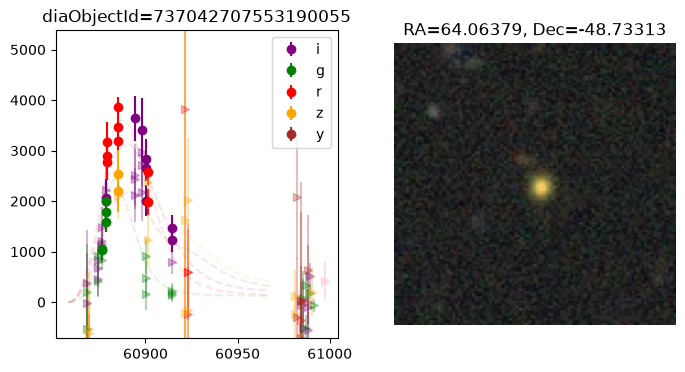

{'x0': 1.8955340405659678e-05, 'x1': -3.977975320972446, 'c': -0.39757006236687886, 'z': 1.23498576677695, 'mwebv': 0.08687059475984826, 't0': 60877.27546030683}
4.0452456399994166 7.146996780619965


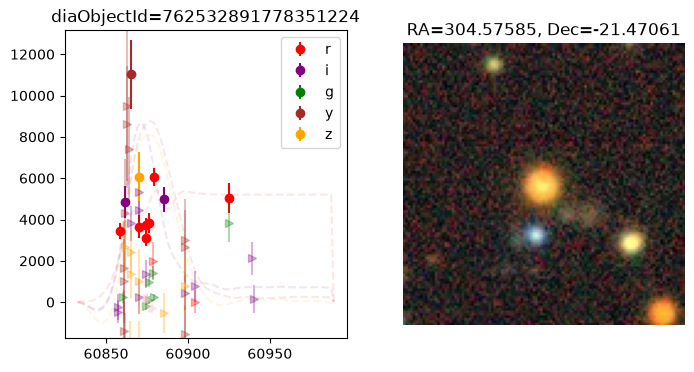

{'x0': 3.674545322600952e-05, 'x1': -2.7856093811731366, 'c': -0.19298181917340285, 'z': 1.4553932940741896, 'mwebv': 0.04826776632654508, 't0': 60879.629202851196}
2.743149559843979 8.307895750271431


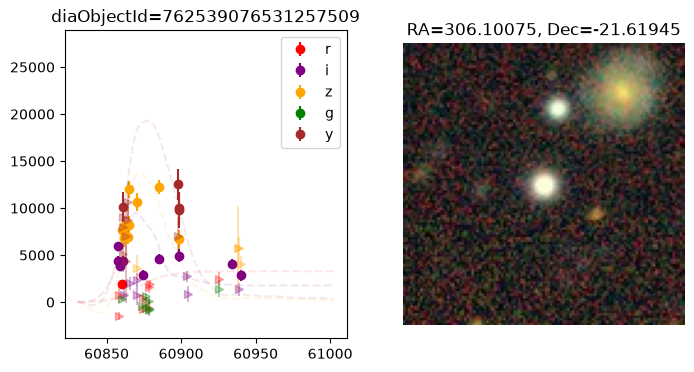

{'x0': 1.0528878580001987e-05, 'x1': -0.27804238669436127, 'c': -0.07885995422736228, 'z': 0.3981452454049136, 'mwebv': 0.007499664672952875, 't0': 60859.73973244571}
0.19413748770772712 1.1388692935230678


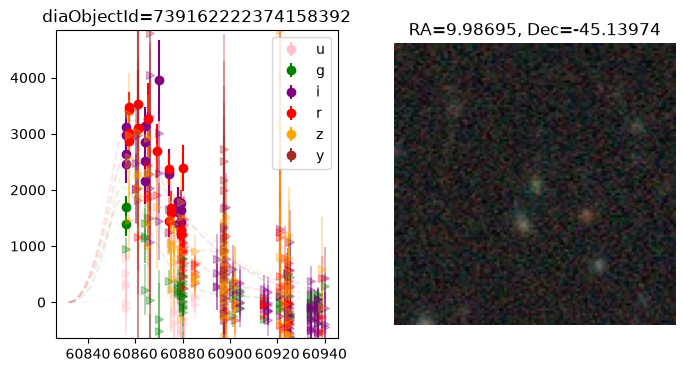

{'x0': 2.5548320306721085e-05, 'x1': -1.2192610254157428, 'c': -0.08783299564319216, 'z': 0.34228342952586766, 'mwebv': 0.012360086163422422, 't0': 60878.724684071014}
0.47269271011547426 1.6045822782945964


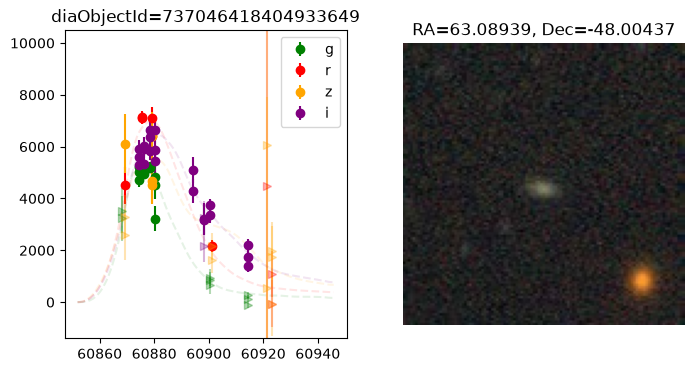

{'x0': 2.4639212273419026e-05, 'x1': -3.097444594225623, 'c': -0.3335764021719508, 'z': 1.7134889623908447, 'mwebv': 0.03366675879041912, 't0': 60875.27066104266}
4.786802122953035 4.694691746379377


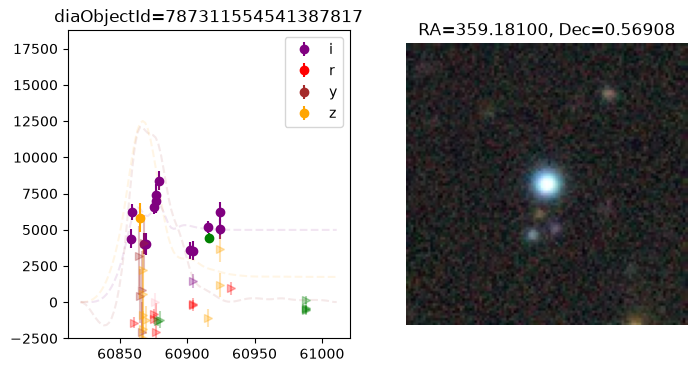

{'x0': 1.5996810609997905e-05, 'x1': 0.6962702895203494, 'c': 0.061999856451365, 'z': 0.5443790863341537, 'mwebv': 0.13350198009894448, 't0': 60863.06903356054}
3.5212167783851847 9.263488605632586


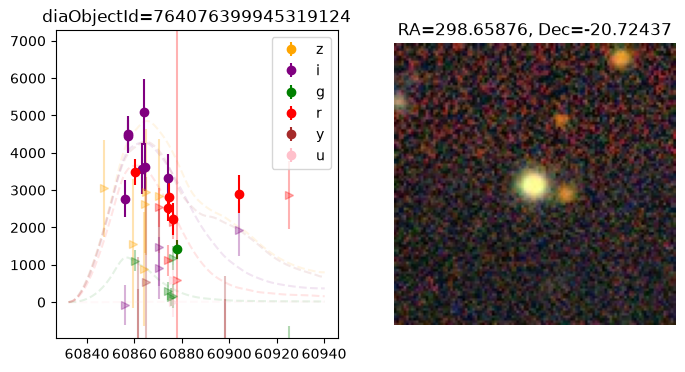

{'x0': 2.62856230516428e-05, 'x1': 0.7190340314384857, 'c': -0.03324996443174145, 'z': 0.37028867179581093, 'mwebv': 0.01016156967193662, 't0': 60879.67403355931}
0.46319964345887726 0.9144748089873214


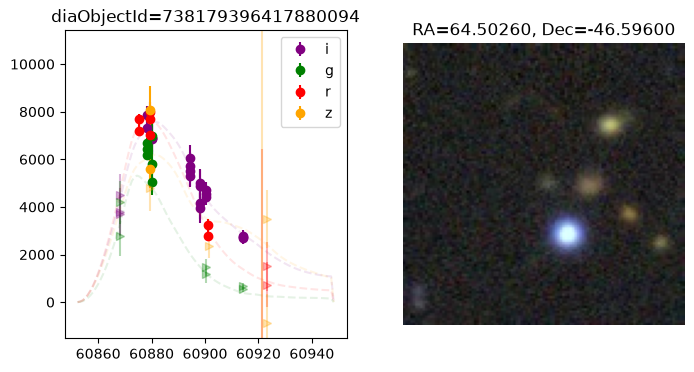

{'x0': 1.7650384864183426e-05, 'x1': -2.393395907658368, 'c': -0.14064752351414936, 'z': 0.3018258443808326, 'mwebv': 0.01091986343976989, 't0': 60883.70984291524}
0.20667988404189036 0.5442851357538578


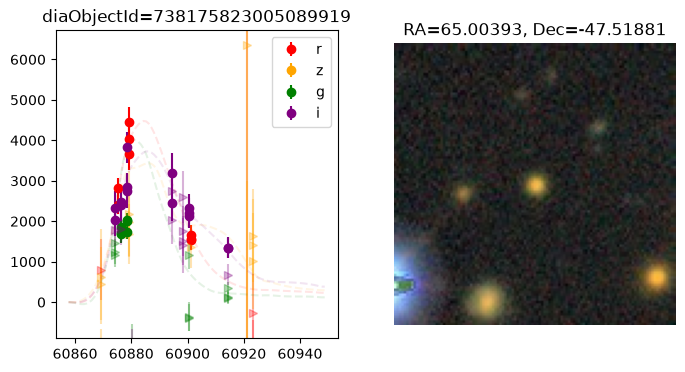

{'x0': 5.157101691440223e-05, 'x1': -2.8379481152982406, 'c': -0.35647641758637433, 'z': 1.9964691545853064, 'mwebv': 0.04491954955456177, 't0': 60887.23320691082}
4.835599221422924 4.390904803152114


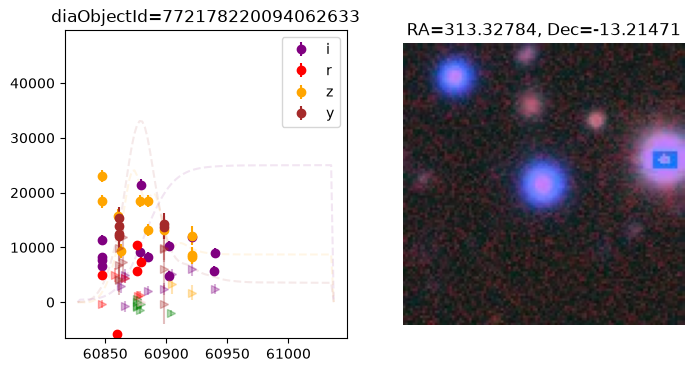

{'x0': 6.860456951097589e-05, 'x1': -1.7868474662137592, 'c': 0.24864598625980414, 'z': 1.3651667309160742, 'mwebv': 0.09889823974487533, 't0': 60878.452510198505}
2.9253652494182782 7.650430855373372


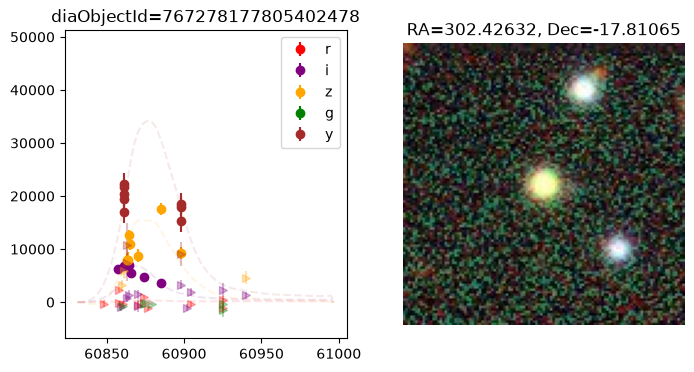

{'x0': 9.13850801372727e-06, 'x1': 1.1775390157215067, 'c': 0.0019452408381947703, 'z': 0.5714734884080102, 'mwebv': 0.005087437832991994, 't0': 60879.01508899462}
0.947919399890483 1.0525904729509437


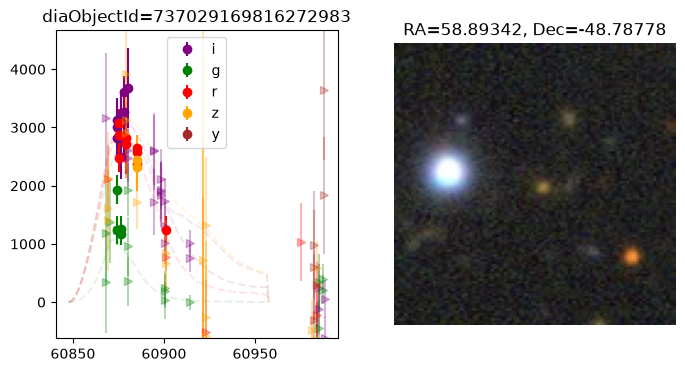

{'x0': 2.601357740040311e-05, 'x1': 0.6758828319507418, 'c': -0.37066758509647196, 'z': 1.425563447093981, 'mwebv': 0.04521166008245569, 't0': 60882.52214868881}
2.633804995899132 4.6492148724727445


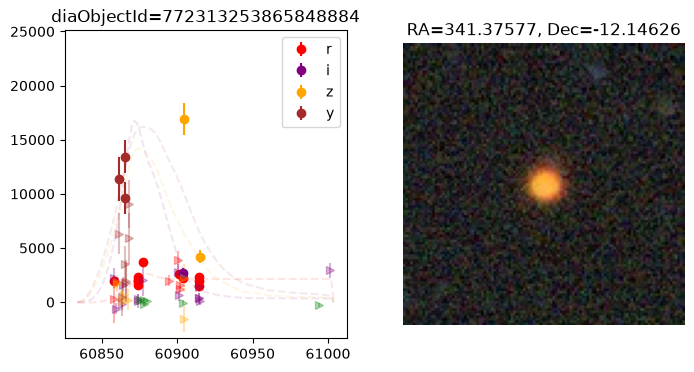

{'x0': 8.076653279476405e-06, 'x1': 0.6628388829379748, 'c': 0.333711123532934, 'z': 0.29860424889674186, 'mwebv': 0.007683751693036682, 't0': 60857.49451271777}
0.9866244610007862 1.4832091403764462


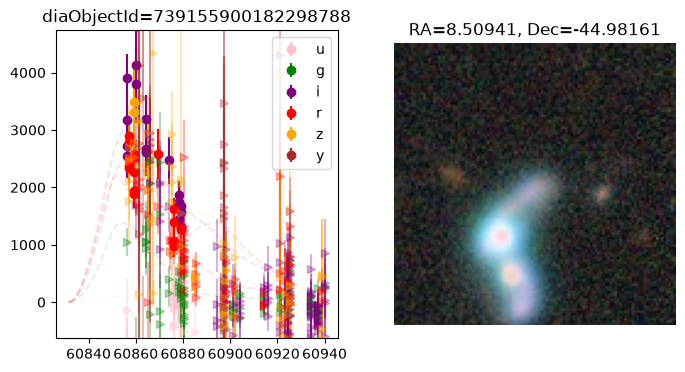

{'x0': 2.1160781767334137e-05, 'x1': 0.24600795891174984, 'c': 0.13039659829872016, 'z': 1.4043485948385561, 'mwebv': 0.0407541658571262, 't0': 60875.78830315807}
3.0850801578569063 6.668658169961603


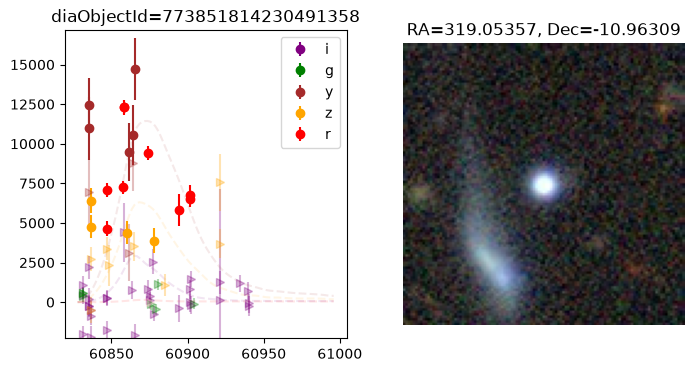

{'x0': 6.450498131283911e-06, 'x1': 0.5186123153099907, 'c': -0.13925952990980944, 'z': 0.6119989770518591, 'mwebv': 0.007933408853275346, 't0': 60994.62605607258}
0.12854157089795065 1.0593699189395964


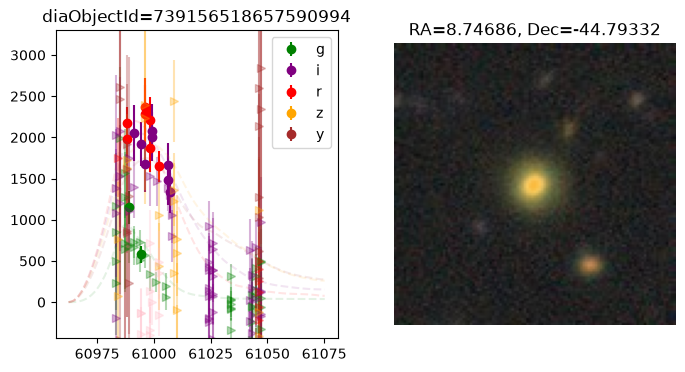

{'x0': 8.834848717581112e-06, 'x1': 3.6842035447768753, 'c': 0.03503028017603242, 'z': 0.4709297427375853, 'mwebv': 0.010707798240124218, 't0': 60865.03700667427}
0.9564935579576106 1.728530047153716


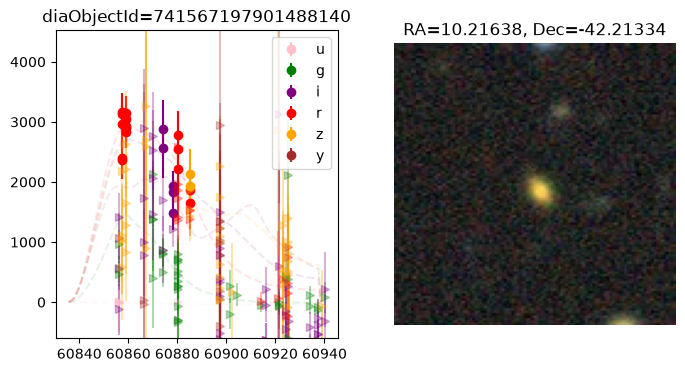

{'x0': 1.3396839388823187e-05, 'x1': -2.7067962368477145, 'c': -0.03994546231742031, 'z': 0.6422245044537713, 'mwebv': 0.00891692341034751, 't0': 60861.02124471804}
1.4630460262277278 1.216624710224289


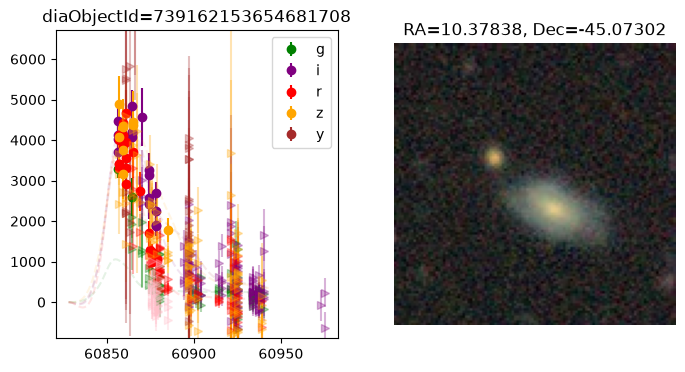

{'x0': 2.33997509161405e-05, 'x1': -1.272103479683506, 'c': -0.07115222532322399, 'z': 1.14189322977464, 'mwebv': 0.04798443537267076, 't0': 60876.25416219231}
3.9651538508944286 8.805416311853156


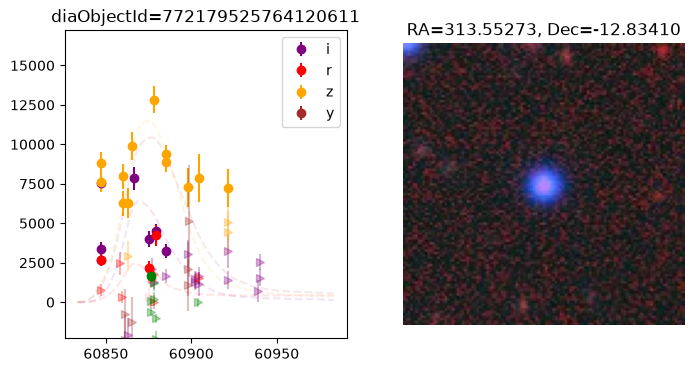

{'x0': 1.0460284844936707e-05, 'x1': 1.0152298119609997, 'c': 0.20391586219326974, 'z': 0.6114490111875369, 'mwebv': 0.006393236211938459, 't0': 60885.84783482071}
2.059195922379052 0.598261108423692


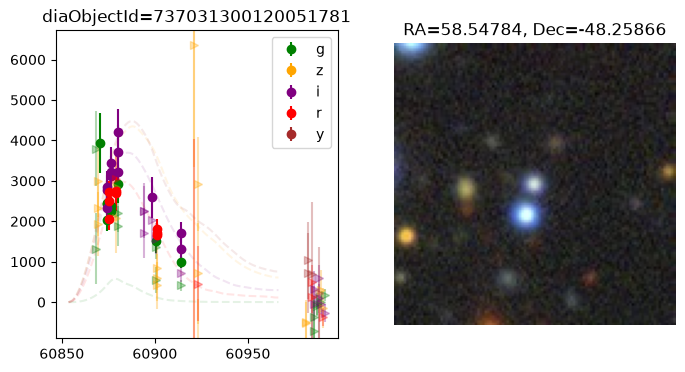

{'x0': 3.6462637131631556e-05, 'x1': 1.8633770898663111, 'c': -0.06846382195529666, 'z': 0.30663918781607735, 'mwebv': 0.010517903206900527, 't0': 61037.194557253824}
4.074110155231217 8.158712385678186


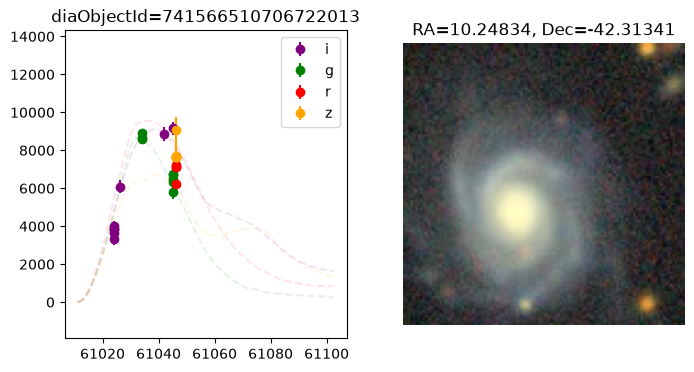

{'x0': 1.2228998894463123e-05, 'x1': 0.6809124683057813, 'c': -0.0655706090198205, 'z': 0.34915663365727273, 'mwebv': 0.007691000485669668, 't0': 60879.381506229336}
1.0098576711778744 0.8991199014381006


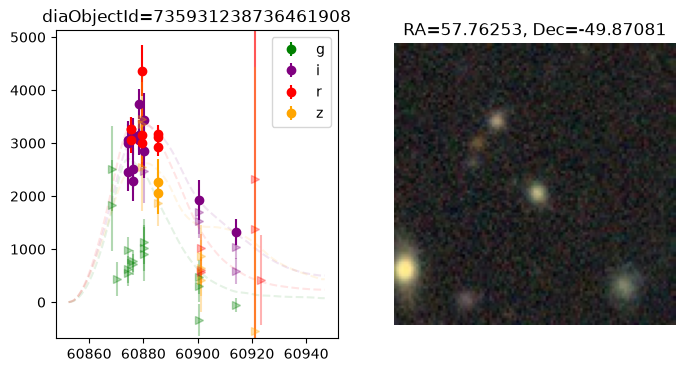

{'x0': 0.0005985829816327725, 'x1': -2.7191155492257364, 'c': 0.39808343803541835, 'z': 1.8099080143961563, 'mwebv': 0.012391012859525189, 't0': 60887.90096930311}
0.20526642161902298 1.1363656090714085


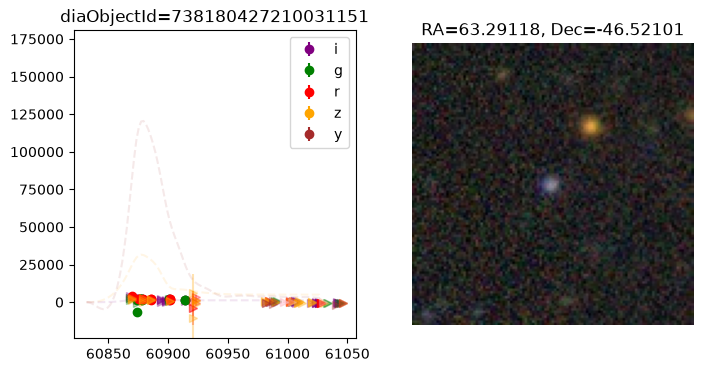

{'x0': 6.544886085819961e-06, 'x1': 2.1370804178801235, 'c': 0.12454408304547852, 'z': 0.5077850335643466, 'mwebv': 0.005821578318745112, 't0': 60886.58494035534}
0.33200991340677605 0.8922985960493697


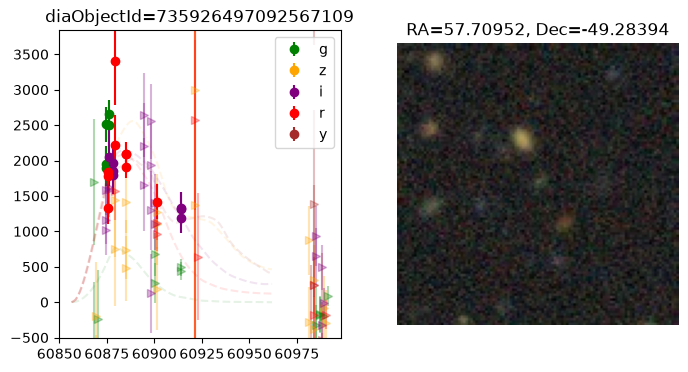

{'x0': 1.355624256791503e-05, 'x1': -3.8679548632275127, 'c': 0.18839290589518048, 'z': 0.3353766121040257, 'mwebv': 0.010413710594626566, 't0': 60875.98090123748}
0.24608639734021465 1.1044283503074004


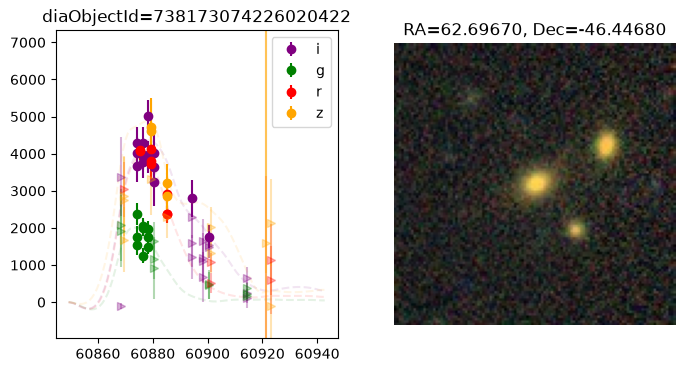

{'x0': 2.9085738866976456e-05, 'x1': 1.9177856857621864, 'c': 0.2526285454583534, 'z': 0.6688555792749097, 'mwebv': 0.03272953895367481, 't0': 60899.878071948566}
4.840846732669322 5.653163827784235


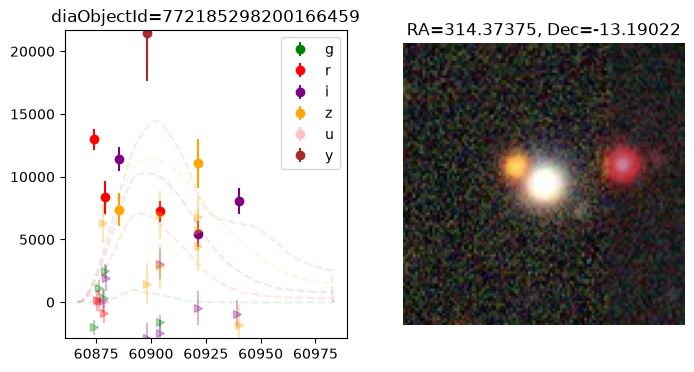

{'x0': 1.2187318768739329e-05, 'x1': 0.5701081802425503, 'c': -0.23398397901121912, 'z': 0.9012184380230986, 'mwebv': 0.008264865799249411, 't0': 60869.7495654693}
0.414538671179246 1.7193249753673978


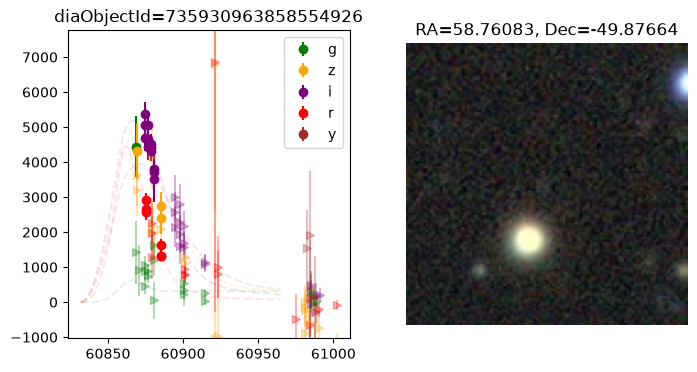

{'x0': 8.304528973314357e-06, 'x1': -0.08318064528559578, 'c': -0.23055893957436707, 'z': 0.5937602923816048, 'mwebv': 0.0051558707836493, 't0': 60867.76095828316}
0.3435966082338456 0.8793479046505543


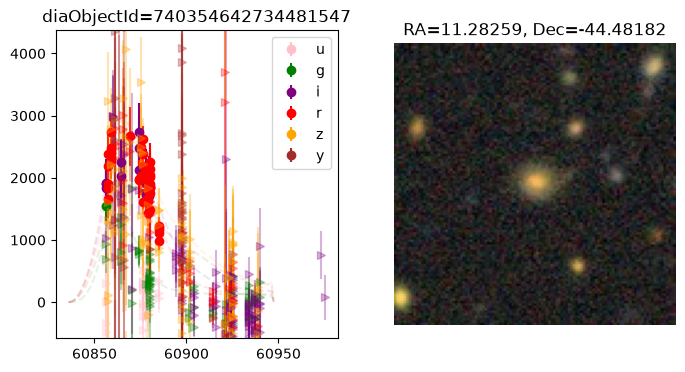

{'x0': 1.3541618974771933e-05, 'x1': 0.752645810804094, 'c': -0.03471306724592481, 'z': 0.46830642213218876, 'mwebv': 0.010998395244091852, 't0': 60888.52525000032}
0.6544023893364274 0.9745589069070161


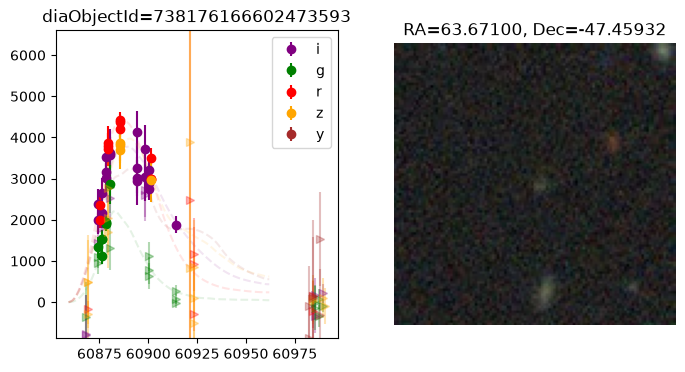

{'x0': 1.2114145043589135e-05, 'x1': 0.6132215548696864, 'c': -0.09685927383027756, 'z': 0.5163391915683551, 'mwebv': 0.010117373821229585, 't0': 60885.16432346384}
0.12156998928006142 1.114548288784012


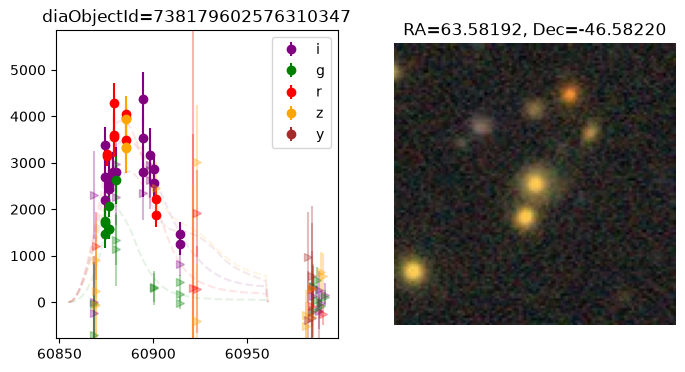

{'x0': 9.172006616518996e-06, 'x1': -3.049805072955497, 'c': -0.3725049561228863, 'z': 1.6091381031522611, 'mwebv': 0.0113708180109135, 't0': 60876.79012371978}
0.34234410735165666 1.173707107364762


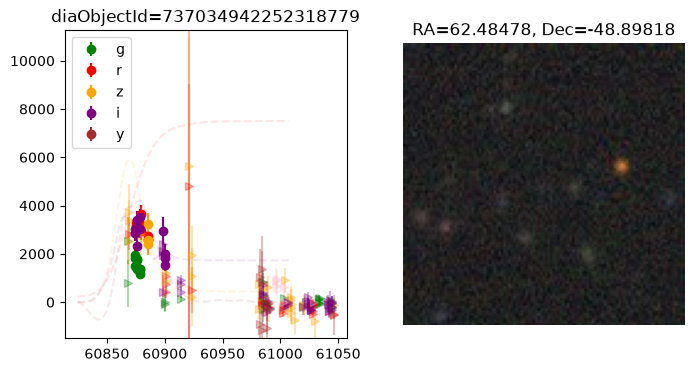

{'x0': 0.00046838846196452916, 'x1': -3.0066297380272125, 'c': 0.09451009524757556, 'z': 1.7789684519501516, 'mwebv': 0.06596900726790805, 't0': 60885.7816903034}
3.978064852986413 6.3142886529455735


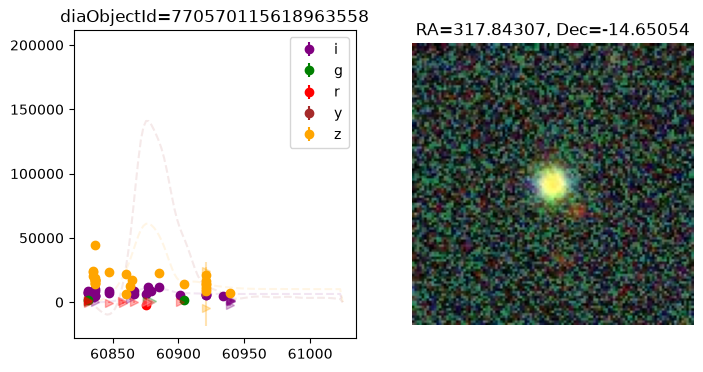

{'x0': 9.601202239813058e-06, 'x1': 0.4317915417390608, 'c': 0.23262446874898218, 'z': 0.30540771656816107, 'mwebv': 0.005737510575012076, 't0': 60885.87850504125}
0.26801779943314025 1.4432015088184738


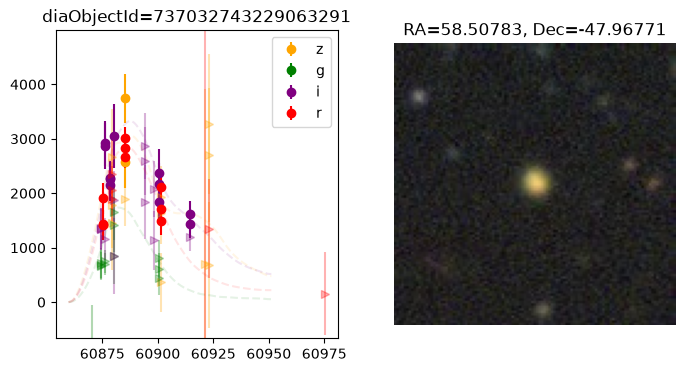

{'x0': 0.0006094906469371611, 'x1': -2.7784946980001743, 'c': 0.08160661833435337, 'z': 2.141936940023227, 'mwebv': 0.08752998541176202, 't0': 60880.42571616104}
4.1763052762566755 9.150962892900255


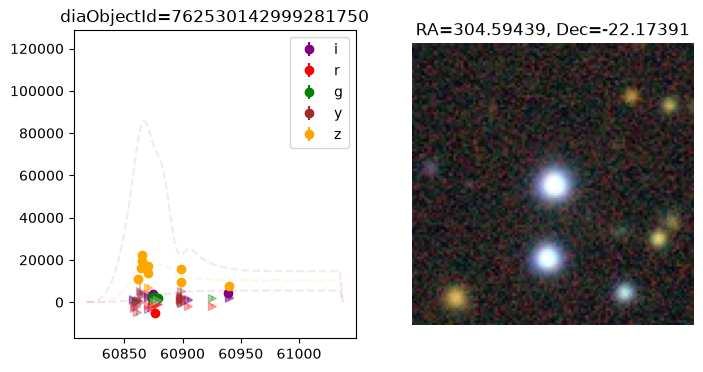

{'x0': 2.7990701188855054e-05, 'x1': -1.0051010346888947, 'c': -0.37899239687533337, 'z': 0.7281562218432329, 'mwebv': 0.05237318189199524, 't0': 60890.197340597704}
4.843353839261733 7.611711063901311


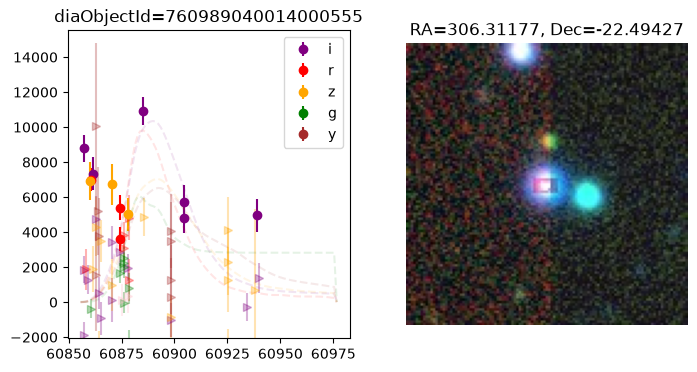

{'x0': 2.2107294168852357e-05, 'x1': 1.499414078882501, 'c': 0.01588464508464644, 'z': 1.3935364213540324, 'mwebv': 0.08972452032659081, 't0': 60892.117228166535}
4.456842741052063 4.741381819888699


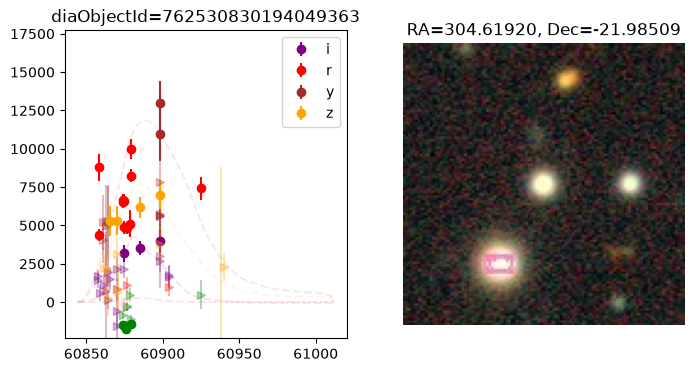

{'x0': 2.3209484959403447e-05, 'x1': 0.5027098928682696, 'c': 0.003577728823526349, 'z': 0.32835371951083725, 'mwebv': 0.010027710626533777, 't0': 60870.44509632272}
0.767377988001956 1.0095163700785978


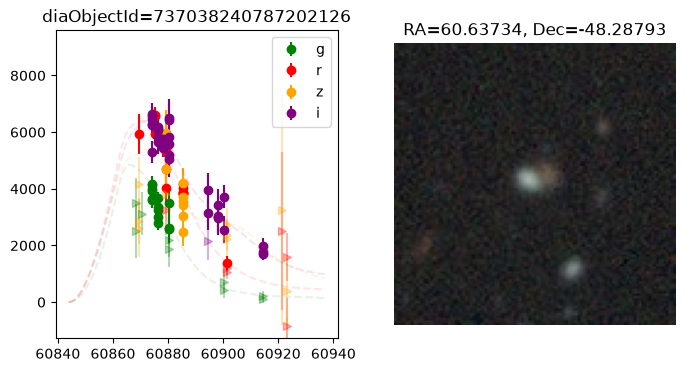

In [53]:
from legacy_survey_cutout import plot_legacy_cutout
cols = ["x0","x1","c","z","mwebv","t0"]
for i in np.random.choice(len(sn),size=np.min([50,len(sn)]),replace=False):
    saltpars_df = result_good.loc[result_good.id==sn.iloc[i]["diaObjectId_dia_object_lc"]]
    saltpars = {}
    for col in cols:
        saltpars[col] = saltpars_df[col].values[0]
    print(saltpars)
    print(sn.iloc[i]["_dist_arcsec"], sn.iloc[i]["reduced_chisq"])
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1)
    lc = sn.iloc[i]["diaObjectForcedSource_dia_object_lc"]
    lc = lc[["midpointMjdTai","band","psfDiffFlux","psfDiffFluxErr"]]
    phase = (lc["midpointMjdTai"] - saltpars["t0"])/(1.+saltpars["z"])
    good_phase = (phase > -20) & (phase < 70)
    lc = lc.loc[good_phase]
    lc["mjd"] = lc["midpointMjdTai"]
    lc["flux"] = lc["psfDiffFlux"]
    lc["fluxerr"] = lc["psfDiffFluxErr"]
    lc["snr"] = lc["flux"]/lc["fluxerr"]
    plot_lc(lc,saltpars=saltpars)
    plt.title(f"diaObjectId={sn.iloc[i]['diaObjectId_dia_object_lc']}")
    # plt.subplot(2,1,2)
    # lc = sn.iloc[i]["diaSource_dia_object_lc"]
    # lc = lc[["midpointMjdTai","band","psfFlux","psfFluxErr"]]
    # lc["mjd"] = lc["midpointMjdTai"]
    # lc["flux"] = lc["psfFlux"]
    # lc["fluxerr"] = lc["psfFluxErr"]
    # lc["snr"] = lc["flux"]/lc["fluxerr"]
    # plot_lc(lc,saltpars=saltpars)
    ax = plt.subplot(1,2,2)
    ra = sn.iloc[i]["ra_dia_object_lc"]
    dec = sn.iloc[i]["dec_dia_object_lc"]
    img = plot_legacy_cutout(ra, dec, size=115, pixscale=0.262, layer="ls-dr10", fmt="jpg",ax=ax)
    plt.show()

In [54]:
print(list(sn["diaObjectId_dia_object_lc"]))

[772323012031545366, 772313253865848884, 780611336840151127, 787311554541387817, 787299253755052043, 737042707553190055, 737046006088073410, 738175823005089919, 735930963858554926, 735931238736461908, 735926497092567109, 735938523000995851, 737042226516852836, 737034942252318779, 737046418404933649, 738175548127182903, 738170325446950914, 738169775691137062, 737038240787202126, 737029169816272983, 737031300120051781, 737032811948540015, 737032743229063291, 738176166602473593, 738179396417880094, 738179602576310347, 738180427210031151, 738173074226020422, 739162153654681708, 739162222374158392, 740354642734481547, 740349351334772822, 739155900182298788, 739156518657590994, 741566510706722013, 741567197901488140, 746165149370417168, 746164530895127175, 746165080650940485, 747509989530141006, 768980015646769207, 768981390036304597, 760989040014000555, 762538389336490152, 762539076531257495, 762539076531257509, 762530142999281750, 762530830194049363, 762532891778351224, 764096878349385860,